# DL Project - Unsupervised Domain Adaptation
### Deep subdomain adaptation network
#### Battocchio Joy, Guidolin Davide

\\

Deep learning course, AA 2021/2022

Prof. Elisa Ricci

Unsupervised Domain Adaptation:

It is often the case that after the training phase of a model, its real usage happen in a different domain (target domain) with respect to the one in which it has been trained (source domain).
This may cause a significant drop in the performance of the model.
If some data of the target domain are available, but its ground truth labels are not, it is possibile to improve the performance via the so called *unsupervised domain adaptations*.
There are many examples of different techniques that implement UDA in the literature, here we present ours.

The first model is simply an implementation of the paper: [Deep Subdomain Adaptation Network for Image
Classification](https://arxiv.org/pdf/2106.09388.pdf).

The idea is to use a simple **domain alignment loss**, but instead of compute it globally, use a self-supervised method to compute on each sub-domain.
A sub-domain is composed of all the samples belonging to a specific class, for both domains. Since we can not access the ground truth labels of the target domain, we will use the predictions.
We implemented the loss as described in the paper, but decided to make some changes in the model and the optimizer.

We then improved its performance by adding a **global shift loss** and stibilizing the training through a simple **self-supervised loss**.

Everything will be explained in details later on.

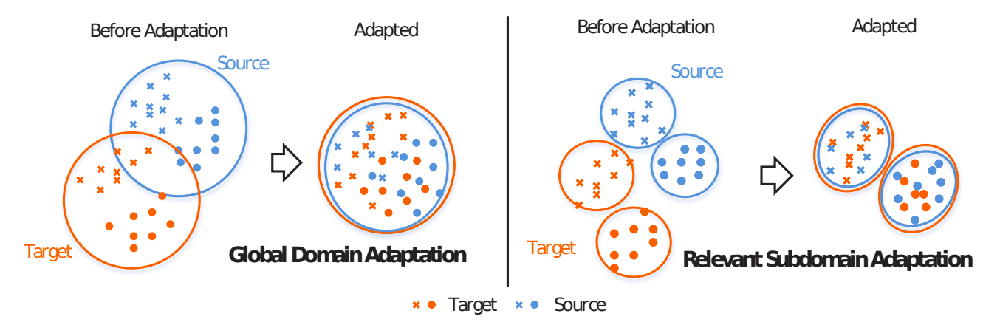

Dataset:

In this assignment we train and evaluate our model on a subset of the *Adaptiope* object recognition dataset, using two of its domain (*real world* and *product*) and only 20 out of the 123 classes.


## How to run the notebook
- Download [Adaptiope dataset](https://drive.google.com/file/d/1FmdsvetC0oVyrFJ9ER7fcN-cXPOWx2gq/view)
- Add the zip at your Google Drive, path: gdrive/My Drive/datasets/Adaptiope.zip
- Run cells in order

## Dataset Loading

In this section we load the dataset and we inspect it.

### Dataset loading

In [ ]:
import os
from os import makedirs, listdir, remove
from os.path import join, exists
from shutil import copytree, move, rmtree, copyfile
from tqdm import tqdm
from google.colab import drive

import numpy as np
import torch
import torchvision
from torch.utils.tensorboard import SummaryWriter
from torchvision.transforms import transforms, Grayscale, RandomRotation, GaussianBlur, ColorJitter, RandomHorizontalFlip, RandomVerticalFlip, RandomErasing, RandomApply
from torchvision.transforms.functional import get_image_size, to_pil_image
from torch.utils.data import DataLoader, ConcatDataset
import torch.nn.functional as F
import torch.nn as nn
from torch.cuda.amp import autocast, GradScaler

import matplotlib.pyplot as plt
from  matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import seaborn as sns
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pandas as pd
import multiprocessing

We set 42 as random seed for pytorch operations. ([why 42?](https://en.wikipedia.org/wiki/Phrases_from_The_Hitchhiker%27s_Guide_to_the_Galaxy#The_Answer_to_the_Ultimate_Question_of_Life,_the_Universe,_and_Everything_is_42))

In [ ]:
torch.manual_seed(42)

To speed up the training process we followed some best practices ([1](https://efficientdl.com/faster-deep-learning-in-pytorch-a-guide/), [2](https://pytorch.org/tutorials/recipes/recipes/tuning_guide.html)) that improved our training time up to a ~30% (depending on the machine provided by colab). 

Here ```torch.backends.cudnn.benchmark = True``` enables the cudNN autotuner which will benchmark a number of different ways of computing convolutions in cudNN and then use the fastest method from then on



In [ ]:
torch.backends.cudnn.benchmark = True

Now we mount the drive, load the dataset and select the 20 classes using the code provided in the Moodle of the course.

In [ ]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!mkdir dataset
!cp "gdrive/My Drive/datasets/Adaptiope.zip" dataset/
!ls dataset

Adaptiope.zip


In [ ]:
%%capture
!unzip dataset/Adaptiope.zip

In [ ]:
!rm -rf adaptiope_small

In [ ]:
!mkdir adaptiope_small
classes = listdir("Adaptiope/product_images")
classes = ["backpack", "bookcase", "car jack", "comb", "crown", "file cabinet", "flat iron", "game controller", "glasses",
           "helicopter", "ice skates", "letter tray", "monitor", "mug", "network switch", "over-ear headphones", "pen",
           "purse", "stand mixer", "stroller"]
for d, td in zip(["Adaptiope/product_images", "Adaptiope/real_life"], ["adaptiope_small/product_images", "adaptiope_small/real_life"]):
    makedirs(td)
    for c in tqdm(classes):
        c_path = join(d, c)
        c_target = join(td, c)
        copytree(c_path, c_target)

100%|██████████| 20/20 [00:05<00:00,  3.60it/s]


### Inspection and Visualization

First of all we check how many images are there for each of the 20 classes.

In [ ]:
image_counts = {
    "product_images": {},
    "real_life": {}
}

# count the images in each folder
base_folder = "adaptiope_small/"
for folder in image_counts:
    for klass in classes:
        path = join(base_folder, folder, klass)
        image_counts[folder][klass] = len(listdir(path))

print(f"Number of classes: {len(classes)}")
print("Number of images for each class:")
for folder in image_counts:
    print(f"\n{folder}:")
    for klass in classes:
        print(f"\t{klass:20} {image_counts[folder][klass]}")

Number of classes: 20
Number of images for each class:

product_images:
	backpack             100
	bookcase             100
	car jack             100
	comb                 100
	crown                100
	file cabinet         100
	flat iron            100
	game controller      100
	glasses              100
	helicopter           100
	ice skates           100
	letter tray          100
	monitor              100
	mug                  100
	network switch       100
	over-ear headphones  100
	pen                  100
	purse                100
	stand mixer          100
	stroller             100

real_life:
	backpack             100
	bookcase             100
	car jack             100
	comb                 100
	crown                100
	file cabinet         100
	flat iron            100
	game controller      100
	glasses              100
	helicopter           100
	ice skates           100
	letter tray          100
	monitor              100
	mug                  100
	network switch       100
	over-

We can notice that there is no class imbalance and we only have 100 images for each class for a total of 2000 images for each domain.

Now we visualize one image for each class for both the source and target domain.

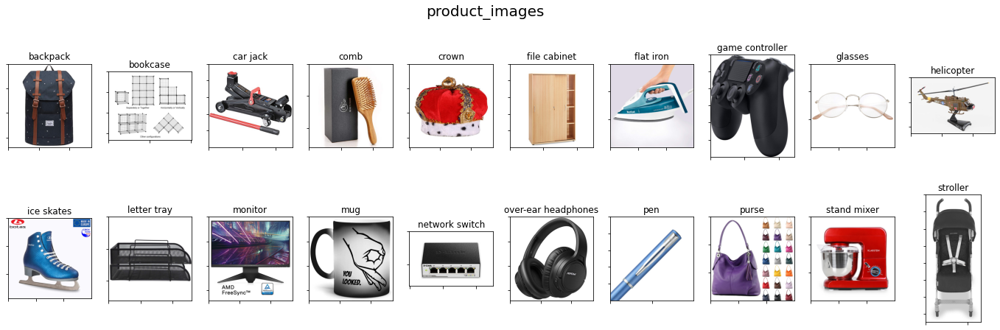

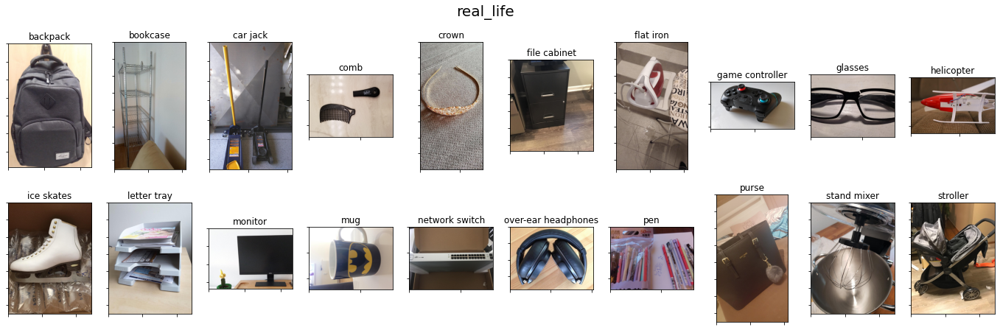

In [ ]:
base_folder = "adaptiope_small/"
nrows = 2
ncols = 10

# for product_images and real_life
for folder in image_counts:
    # create figure
    fig = plt.figure(figsize=(24, 7))
    fig.suptitle(folder, fontsize=20)

    # add subplots to create 2x10 grid
    ax = [ fig.add_subplot(nrows, ncols, r * ncols + c + 1) for r in range(0, nrows) for c in range(0, ncols) ]
    
    # show an image for each class in each subplot
    for i, klass in enumerate(classes):
        path = join(base_folder, folder, klass)
        image_path = join(path, listdir(path)[0])
        im = plt.imread(image_path)
        
        ax[i].imshow(im)
        ax[i].set_title(klass)
    
    for a in ax:
        a.set_xticklabels([])
        a.set_yticklabels([])
        a.set_aspect('equal')

    plt.show()
    print("\n\n")

We can see that the images have different sizes, so we will need to resize them to have the same size for all the data. 

We can also notice the difficulty of the task: all the images in the product domain are taken from a frontal position and all have a white background, while the images on the real world domain are taken from different angles and the background is very heterogeneous and in some cases there are also other objects that appear in the image.

### Creation of Dataloaders
Here we create the dataloaders that will be ready for use during training and testing.


We need to modify a bit the dataset folder to subdivide it into training and test folders. We do it because if we load the entire folder using the `torchvision.datasets.ImageFolder` class we will not be able to split the dataset and at the same time keep the balance between classes. In this way we split the dataset in 2 folders and then we can use `ImageFolder` with each folder. As agreed with the professor, given the low number of images, we don't create a validation dataset and we will use the test set for intermediate evaluation.

In [ ]:
def split_data(train=0.8, test=0.2):

    idxs = np.arange(0, 100)
    #np.random.shuffle(idxs)

    # split each class of 100 images in train/test 
    n_train = int(len(idxs) * train)
    train_idxs = idxs[:n_train]
    test_idxs = idxs[n_train:]
    
    base_path = 'adaptiope_small'
    for folder in ['adaptiope_small/train/', 'adaptiope_small/test/']:
        
        for subfolder in ['product_images/', 'real_life/']:
            path = join(folder, subfolder)
            if not os.path.exists(path):
                makedirs(path)
            
            for klass in classes:
                if not os.path.exists(join(path, klass)):
                    makedirs(join(path, klass))

                if 'train' in folder:
                    # move the first train_idxs images of the klass in adaptiope_small/train/{subfolder}/{klass}/
                    for i in train_idxs:
                        image_path_src = join(base_path, subfolder, klass, f"{klass}_0{i:02d}.jpg")
                        image_path_dst = join(folder, subfolder, klass, f"{klass}_0{i:02d}.jpg")
                        move(image_path_src, image_path_dst)
                
                if 'test' in folder:
                    # move the rest of the images of the klass in adaptiope_small/test/{subfolder}/{klass}/
                    for i in test_idxs:
                        image_path_src = join(base_path, subfolder, klass, f"{klass}_0{i:02d}.jpg")
                        image_path_dst = join(folder, subfolder, klass, f"{klass}_0{i:02d}.jpg")
                        move(image_path_src, image_path_dst)

    # delete old folders
    rmtree("adaptiope_small/product_images")
    rmtree("adaptiope_small/real_life")

In [ ]:
split_data()

Now we define the function used to create the dataloaders that will be used during training and testing.

First of all we resize all the images and then we apply the augmentation.

The chosen transformation for the augmented part are the following:
1.   Rotation
2.   Horizontal flip
3.   Vertical flip
4.   Color jitter

They are applied randomly in order to have a set that is more eterogeneous.

We tried many other transformations but these showed to be the best ones for our purpose.

In [ ]:
def data_augmentation(folder_root, size, threshold=0.7, n_aug=4):

    # transformation used for augmentation
    transformations = [
                RandomRotation(degrees=90, fill=255), 
                RandomHorizontalFlip(p=1.0), 
                RandomVerticalFlip(p=1.0),
                ColorJitter(0.5, 0.5, 0.5, 0.5)
            ]

    datasets = []

    for i in range(n_aug):
        # first of all resize the image
        tr = [transforms.Resize(size)]

        # randomly apply each transformation with probability=threshold
        for t in transformations:
            tr.append(RandomApply([t], p=threshold))
        
        tr.append(transforms.ToTensor())
        tr = transforms.Compose(tr)
        # apply the transformations to the images stored in folder_root
        d = torchvision.datasets.ImageFolder(folder_root, transform=tr)
        datasets.append(d)
    
    # concatenate the n_aug augmented datasets
    return ConcatDataset(datasets)    

In [ ]:
class_to_idx_prod = None
class_to_idx_rw = None

# num_workers is used to load the data in parallel to speed up the loading process
def get_data(batch_size=128, size=(224, 224), num_workers=2):
    global class_to_idx_prod
    global class_to_idx_rw

    # standard transformations applied to all the images
    train_transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor()
    ])

    test_transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor()
    ])

    train_product_root = "adaptiope_small/train/product_images"
    train_rworld_root = "adaptiope_small/train/real_life"
    test_product_root = "adaptiope_small/test/product_images"
    test_rworld_root = "adaptiope_small/test/real_life"

    # DATASETS

    # train product dataset
    train_product_dataset_standard = torchvision.datasets.ImageFolder(train_product_root, transform=train_transform)
    train_product_dataset_augmented = data_augmentation(train_product_root, size=size)
    train_product_dataset = ConcatDataset([train_product_dataset_standard, train_product_dataset_augmented])
    # save classes
    class_to_idx_prod = train_product_dataset_standard.class_to_idx 

    # train rworld dataset
    train_rworld_dataset_standard = torchvision.datasets.ImageFolder(train_rworld_root, transform=train_transform)
    train_rworld_dataset_augmented = data_augmentation(train_rworld_root, size=size)
    train_rworld_dataset = ConcatDataset([train_rworld_dataset_standard, train_rworld_dataset_augmented])
    # save classes
    class_to_idx_rw = train_rworld_dataset_standard.class_to_idx
    
    # test datasets
    test_product_dataset = torchvision.datasets.ImageFolder(test_product_root, transform=test_transform)
    test_rworld_dataset = torchvision.datasets.ImageFolder(test_rworld_root, transform=test_transform)
    
    # DATALOADERS

    # train dataloaders
    train_product_loader = DataLoader(train_product_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
    train_rworld_loader = DataLoader(train_rworld_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
    train_product_loader_notAug = DataLoader(train_product_dataset_standard, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
    train_rworld_loader_notAug = DataLoader(train_rworld_dataset_standard, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)

    # test dataloaders
    test_product_loader = DataLoader(test_product_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)
    test_rworld_loader = DataLoader(test_rworld_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

    return train_product_loader, train_rworld_loader, train_product_loader_notAug, train_rworld_loader_notAug, test_product_loader, test_rworld_loader

In [ ]:
BATCH_SIZE = 32
cpu_cores = multiprocessing.cpu_count()

# instantiates dataloaders
train_product_loader, train_rworld_loader, train_product_loader_notAug, train_rworld_loader_notAug, \
test_product_loader, test_rworld_loader = get_data(batch_size=BATCH_SIZE, num_workers=cpu_cores)

In [ ]:
# we can use classes as labels for the confusion matrix because the dataset does not change the order
list(class_to_idx_prod.keys()) == classes and list(class_to_idx_rw.keys()) == classes

True

In [ ]:
# folder in which we save the models and the training checkpoints
MODELS_PATH = "/content/gdrive/MyDrive/DSAN/Models_50/"
# folder in which we save the logs
LOGS_PATH = "/content/gdrive/MyDrive/DSAN/Logs/runs"

### Utils

Here we define some functions to get the activations values from the hidden layers and to plot the T-SNE of these values

In [ ]:
# Take the model, the data loader and the layer from which we want the activations.
# Perform a forward pass and return the activations
def get_activations(model, data_loader, layer, device='cuda', dsan=False):

    activations = torch.tensor([]).to(device)
    labels = torch.tensor([]).to(device)

    # define hook to get outputs of the layer
    def hook(model, input, output):
        nonlocal activations
        activations = torch.cat([activations, output], dim=0)
    
    # register the hook
    handle = layer.register_forward_hook(hook)

    model.eval()

    # perform the forward pass
    with torch.no_grad():
        for (input, label) in data_loader:
            input = input.to(device)
            if dsan:
                out = model.inference(input)
            else:
                out = model(input)
            labels = torch.cat([labels, label.to(device)], dim=0)

    handle.remove()

    return activations.cpu(), labels.cpu()

In [ ]:
def plot_tsne(model, layer, source_loader, target_loader, title, dsan=False):

    # get activations for the source and target data
    source_activations, source_labels = get_activations(model, source_loader, layer, dsan=dsan)
    target_activations, target_labels = get_activations(model, target_loader, layer, dsan=dsan)

    # perform the pca to reduce the number of dimensions
    pca = PCA(n_components=100)
    pca_transform_source = torch.from_numpy(pca.fit_transform(source_activations.squeeze()))
    pca_transform_target = torch.from_numpy(pca.fit_transform(target_activations.squeeze()))

    # calculate the T-SNE using the sklearn function
    tsne = TSNE(n_components=2, verbose=0, learning_rate='auto', init='random', n_jobs=2)
    tsne_results = torch.from_numpy(tsne.fit_transform(torch.cat([pca_transform_source, pca_transform_target])))

    tsne_source, tsne_target = torch.split(tsne_results, split_size_or_sections=source_activations.shape[0])

    tsne_source_df = pd.DataFrame()
    tsne_target_df = pd.DataFrame()

    tsne_source_df['tsne_one'] = tsne_source.numpy()[:, 0]
    tsne_source_df['tsne_two'] = tsne_source.numpy()[:, 1]
    tsne_source_df['label'] = source_labels.int()
    tsne_source_df['domain'] = 'source'

    tsne_target_df['tsne_one'] = tsne_target.numpy()[:, 0]
    tsne_target_df['tsne_two'] = tsne_target.numpy()[:, 1]
    tsne_target_df['label'] = target_labels.int()
    tsne_target_df['domain'] = 'target'
    
    concat = pd.concat([tsne_source_df.assign(dataset='source'), tsne_target_df.assign(dataset='target')])
    
    # plot the t-sne
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(21, 9))
    fig.suptitle(title, fontsize=16)
    axes[0].title.set_text("Domains")

    p1 = sns.scatterplot(
        x='tsne_one', 
        y='tsne_two',
        hue="domain",
        palette=sns.color_palette("bright", n_colors=2),
        data=concat,
        legend="full",
        alpha=0.7,
        ax=axes[0]
    )

    p1.set(xlabel=None)
    p1.set(ylabel=None)

    axes[1].title.set_text("Labels")

    p2 = sns.scatterplot(
        x='tsne_one', 
        y='tsne_two',
        hue="label",
        palette=sns.color_palette("gist_rainbow", n_colors=20),
        data=concat,
        legend='full',
        alpha=0.7,
        ax=axes[1]
    )
    
    for t, l in zip(p2.legend_.texts, classes):
        t.set_text(l)

    p2.set(xlabel=None)
    p2.set(ylabel=None)

Definition of the color map for the confusion matrices

In [ ]:
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 21))
nclasses = 20
shades = np.array([70/256, 0/256, 0/256, 0.95])
shades = np.vstack((shades,np.array([120/256, 0/256, 20/256, 0.95])))
shades = np.vstack((shades,np.array([190/256, 0/256, 20/256, 0.95])))
shades = np.vstack((shades,np.array([256/256, 0/256, 20/256, 0.95])))
shades = np.vstack((shades,np.array([256/256, 50/256, 20/256, 0.95])))
shades = np.vstack((shades,np.array([256/256, 100/256, 20/256, 0.95])))
shades = np.vstack((shades,np.array([256/256, 150/256, 20/256, 0.95])))
shades = np.vstack((shades,np.array([256/256, 200/256, 20/256, 0.95])))
shades = np.vstack((shades,np.array([256/256, 240/256, 20/256, 0.95])))
shades = np.vstack((shades, np.array([256/256, 240/256, 20/256, 0.95])))
shades = np.vstack((shades, np.array([256/256, 240/256, 20/256, 0.95])))
shades = np.vstack((shades, np.array([256/256, 240/256, 20/256, 0.95])))
shades = np.vstack((shades, np.array([256/256, 240/256, 20/256, 0.95])))
shades = np.vstack((shades, np.array([256/256, 240/256, 20/256, 0.95])))
shades = np.vstack((shades, np.array([200/256, 256/256, 20/256, 0.95])))
shades = np.vstack((shades, np.array([140/256, 256/256, 20/256, 0.95])))
shades = np.vstack((shades, np.array([50/256, 256/256, 20/256, 0.95])))
shades = np.vstack((shades, np.array([20/256, 256/256, 80/256, 0.95])))
shades = np.vstack((shades, np.array([20/256, 256/256, 150/256, 0.95])))
shades = np.vstack((shades, np.array([20/256, 200/256, 200/256, 0.95])))
shades = np.vstack((shades, np.array([20/256, 150/256, 256/256, 0.95])))


for i in range (0,nclasses+1):
    newcolors[i:i+1, :] = shades[i]
CM_CMAP = ListedColormap(newcolors)

## Baseline Model

In this section we will train the model that will be used as baseline.
We will use a pretrained ResNet network and we will fine tune it on our data.

The baseline consists of the accuracy score obtained by testing the model on the target domain after training it on the source domain without any UDA method.

### Resnet initialization

We start by initializing the network and changing the last layer to make it output 20 classes instead of 1000

In [ ]:
import torchvision.models as models

def init_resnet(n_classes, size=18, pretrained=True):

    # use the correct ResNet based on the size parameter
    if size == 18:
        resnet = models.resnet18(weights='ResNet18_Weights.DEFAULT')
    elif size == 34:
        resnet = models.resnet34(weights='ResNet34_Weights.DEFAULT')
    elif size == 50:
        resnet = models.resnet50(weights='ResNet50_Weights.DEFAULT')
    else:
        print(f"Size {size} not supported for resnet. Using resnet 18")
        resnet = models.resnet18(weights='ResNet18_Weights.DEFAULT')

    # get size of input features to the final layer
    in_features = resnet.fc.in_features

    # replace the final layer with a Linear layer that outputs n_classes values
    resnet.fc = torch.nn.Linear(in_features=in_features, out_features=n_classes)

    return resnet

### Cost Function

As cost function we will use a Cross Entropy Loss.

In [ ]:
def get_cost_function():
    cost_function = torch.nn.CrossEntropyLoss(reduction='sum')
    return cost_function

### Optimizer

We use Adam as optimizer with a learning rate reduced by a factor of 10 for the parameters of the network that are not in the last layer.

In [ ]:
def get_optimizer(model, lr, weight_decay):
    final_layer_weights = []
    other_weights = []

    for name, param in model.named_parameters():
        if name.startswith('fc.'):  # get final layer weights
            final_layer_weights.append(param)
        else:  # get other weights
            other_weights.append(param)
    
    # create optimizer
    optimizer = torch.optim.Adam([
        {'params': other_weights},
        {'params': final_layer_weights, 'lr': lr}
    ], lr = lr/10, weight_decay=weight_decay)

    return optimizer

### Training and test functions

Now we define the function used for training and evaluation.

In [ ]:
def training_step(net, data_loader, optimizer, cost_function, device='cuda'):

    samples = 0.
    cumulative_loss = 0.
    cumulative_accuracy = 0.

    # set the network to training mode
    net.train() 

    # iterate over the training set
    for batch_idx, (inputs, targets) in enumerate(data_loader):

        # load data into GPU
        inputs = inputs.to(device)
        targets = targets.to(device)
            
        # forward pass
        outputs = net(inputs)

        # loss computation
        loss = cost_function(outputs, targets)

        # backward pass
        loss.backward()

        # parameters update
        optimizer.step()

        # gradients reset
        optimizer.zero_grad()

        # fetch prediction and loss value
        samples += inputs.shape[0]
        cumulative_loss += loss.item()
        _, predicted = outputs.max(dim=1) # max() returns (maximum_value, index_of_maximum_value)

        # compute training accuracy
        cumulative_accuracy += predicted.eq(targets).sum().item()

    return cumulative_loss/samples, cumulative_accuracy/samples*100

def test_step(net, data_loader, cost_function, device='cuda'):

    samples = 0.
    cumulative_loss = 0.
    cumulative_accuracy = 0.

    outputs_all = []
    targets_all = []

    # set the network to evaluation mode
    net.eval() 

    # disable gradient computation
    with torch.no_grad():

        # iterate over the test set
        for batch_idx, (inputs, targets) in enumerate(data_loader):
      
            # load data into GPU
            inputs = inputs.to(device)
            targets = targets.to(device)
                
            # forward pass
            outputs = net(inputs)

            # loss computation
            loss = cost_function(outputs, targets)

            # fetch prediction and loss value
            samples += inputs.shape[0]
            cumulative_loss += loss.item()
            _, predicted = outputs.max(dim=1)

            # compute accuracy
            cumulative_accuracy += predicted.eq(targets).sum().item()

            outputs_all.extend(predicted.cpu().tolist())
            targets_all.extend(targets.cpu().tolist())

    return cumulative_loss/samples, cumulative_accuracy/samples*100, outputs_all, targets_all

### Training the networks

In [ ]:
def baseline(train_loader,
             test_loader,
             visualization_name,
             resnet_size=18,
             device='cuda:0', 
             learning_rate=0.001, 
             weight_decay=0.000001,
             epochs=20, 
             num_classes=20,
             log_path='/content/gdrive/MyDrive/DSAN/Logs',
             start_patience=5,
             use_patience = False):
  
    # instantiate the logger
    writer = SummaryWriter(log_dir=join(log_path, f'runs/{visualization_name}'))
    
    # instantiate the model
    net = init_resnet(n_classes=num_classes, size=resnet_size).to(device)
    
    # instantiate the optimizer
    optimizer = get_optimizer(net, learning_rate, weight_decay)
    
    # instantiates the cost function
    cost_function = get_cost_function()

    # early stopping
    best_acc = 0
    patience = start_patience

    # range over the number of epochs
    for e in range(epochs):
        train_loss, train_accuracy = training_step(net, train_loader, optimizer, cost_function)
        test_loss, test_accuracy, _, _ = test_step(net, test_loader, cost_function)
        print('Epoch: {:d}'.format(e+1))
        print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
        print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
        
        # add values to logger
        writer.add_scalar('Loss/train_loss', train_loss, e + 1)
        writer.add_scalar('Loss/test_loss', test_loss, e + 1)
        writer.add_scalar('Accuracy/train_accuracy', train_accuracy, e + 1)
        writer.add_scalar('Accuracy/test_accuracy', test_accuracy, e + 1)

        if use_patience:
            # update patience for early stopping
            if test_accuracy > best_acc:
                best_acc = test_accuracy
                patience += 1 if patience < start_patience else 0
            else:
                patience -= 1

            print('\t Patience: {}'.format(patience))
            print('-----------------------------------------------------')

            if patience == 0:
                print(f"Patience at 0. Stopping training")
                break

    # perform final test step and print the final metrics
    print('After training:')
    train_loss, train_accuracy , _, _= test_step(net, train_loader, cost_function)
    test_loss, test_accuracy, _, _ = test_step(net, test_loader, cost_function)

    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')

    # close the logger
    writer.close()

    return net

### Baseline product → real world

Here we train the model only on the **product domain** and test it on the **real world domain**. 

We use a ResNet50.

In [ ]:
product_net = baseline(train_product_loader_notAug, test_rworld_loader, resnet_size=50, epochs=10, visualization_name='resnet50_baseline_product_new', learning_rate=0.0001, start_patience=5, use_patience = False)
product_net = product_net.to('cpu')

Epoch: 1
	 Training loss 2.80228, Training accuracy 29.56
	 Test loss 2.69065, Test accuracy 30.50
Epoch: 2
	 Training loss 2.12719, Training accuracy 79.31
	 Test loss 2.15877, Test accuracy 54.50
Epoch: 3
	 Training loss 1.26649, Training accuracy 93.56
	 Test loss 1.61809, Test accuracy 65.75
Epoch: 4
	 Training loss 0.62890, Training accuracy 95.62
	 Test loss 1.24644, Test accuracy 72.75
Epoch: 5
	 Training loss 0.34946, Training accuracy 97.12
	 Test loss 1.09387, Test accuracy 74.25
Epoch: 6
	 Training loss 0.21157, Training accuracy 97.81
	 Test loss 0.98901, Test accuracy 74.00
Epoch: 7
	 Training loss 0.13983, Training accuracy 98.81
	 Test loss 0.91556, Test accuracy 75.75
Epoch: 8
	 Training loss 0.10602, Training accuracy 99.00
	 Test loss 0.87577, Test accuracy 75.75
Epoch: 9
	 Training loss 0.07906, Training accuracy 99.31
	 Test loss 0.83219, Test accuracy 76.75
Epoch: 10
	 Training loss 0.06588, Training accuracy 99.44
	 Test loss 0.80276, Test accuracy 78.25
After tra

In [ ]:
# save the model
torch.save(product_net, f'{MODELS_PATH}/baseline_product.pt')

In [ ]:
# empty the gpu cache
torch.cuda.empty_cache()

### Baseline real world → product 

Here we train the model only on the **real world domain** and test it on the **product domain**.

In [ ]:
rworld_net = baseline(train_rworld_loader_notAug, test_product_loader, resnet_size=50, epochs=10, visualization_name='resnet50_baseline_rworld_new', learning_rate=0.0001, start_patience=5)
rworld_net = rworld_net.to('cpu')

Epoch: 1
	 Training loss 2.82647, Training accuracy 29.00
	 Test loss 2.65346, Test accuracy 60.50
Epoch: 2
	 Training loss 2.31089, Training accuracy 78.25
	 Test loss 2.14938, Test accuracy 83.00
Epoch: 3
	 Training loss 1.58768, Training accuracy 90.94
	 Test loss 1.44176, Test accuracy 88.00
Epoch: 4
	 Training loss 0.94159, Training accuracy 94.38
	 Test loss 0.91890, Test accuracy 90.75
Epoch: 5
	 Training loss 0.55363, Training accuracy 95.75
	 Test loss 0.63241, Test accuracy 91.25
Epoch: 6
	 Training loss 0.35357, Training accuracy 96.88
	 Test loss 0.48103, Test accuracy 92.25
Epoch: 7
	 Training loss 0.24154, Training accuracy 97.81
	 Test loss 0.39172, Test accuracy 92.75
Epoch: 8
	 Training loss 0.15776, Training accuracy 99.06
	 Test loss 0.34860, Test accuracy 92.25
Epoch: 9
	 Training loss 0.13041, Training accuracy 98.56
	 Test loss 0.31185, Test accuracy 92.75
Epoch: 10
	 Training loss 0.10298, Training accuracy 98.94
	 Test loss 0.28557, Test accuracy 92.75
After tra

In [ ]:
# save the model
torch.save(rworld_net, f'{MODELS_PATH}/baseline_rworld.pt')

In [ ]:
torch.cuda.empty_cache()

### Baseline test

Trained on **product domain** and tested on **real world domain**.

In [ ]:
sns.set_style('white')

Baseline accuracy on real world domain: 78.25


                     precision    recall  f1-score   support

           backpack       0.71      1.00      0.83        20
           bookcase       0.94      0.80      0.86        20
           car jack       0.64      0.35      0.45        20
               comb       0.62      0.75      0.68        20
              crown       0.90      0.90      0.90        20
       file cabinet       0.70      0.70      0.70        20
          flat iron       0.94      0.85      0.89        20
    game controller       1.00      0.85      0.92        20
            glasses       0.93      0.65      0.76        20
         helicopter       0.75      0.75      0.75        20
         ice skates       0.90      0.90      0.90        20
        letter tray       0.50      0.80      0.62        20
            monitor       0.53      0.85      0.65        20
                mug       1.00      0.70      0.82        20
     network switch       0.89      

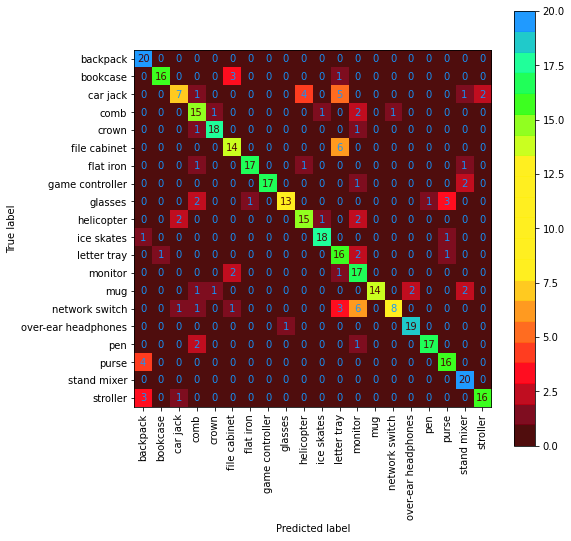

In [ ]:
product_net = torch.load(f'{MODELS_PATH}/baseline_product.pt')

product_net.to('cuda:0')

loss, acc, outputs, targets = test_step(product_net, test_rworld_loader, get_cost_function())
print(f"Baseline accuracy on real world domain: {acc}\n")
print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

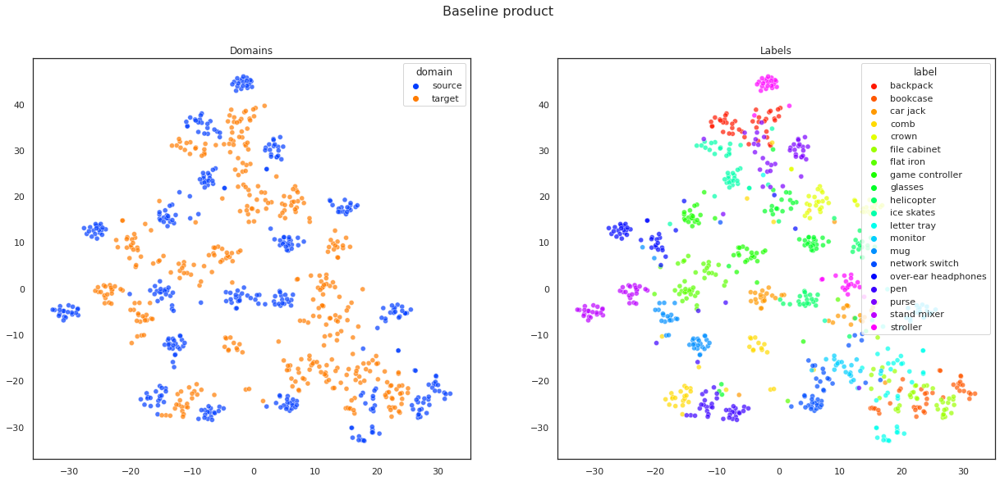

In [ ]:
plot_tsne(product_net, product_net.avgpool, test_product_loader, test_rworld_loader, "Baseline product")

Trained on **real world domain** and tested on **product domain**

Baseline accuracy on product domain: 92.75


                     precision    recall  f1-score   support

           backpack       0.95      0.90      0.92        20
           bookcase       0.81      0.85      0.83        20
           car jack       0.95      0.95      0.95        20
               comb       0.95      1.00      0.98        20
              crown       1.00      0.85      0.92        20
       file cabinet       0.64      0.80      0.71        20
          flat iron       0.86      0.95      0.90        20
    game controller       0.95      1.00      0.98        20
            glasses       0.95      1.00      0.98        20
         helicopter       0.95      0.95      0.95        20
         ice skates       1.00      0.90      0.95        20
        letter tray       1.00      0.80      0.89        20
            monitor       1.00      0.95      0.97        20
                mug       0.95      1.00      0.98        20
     network switch       1.00      0.9

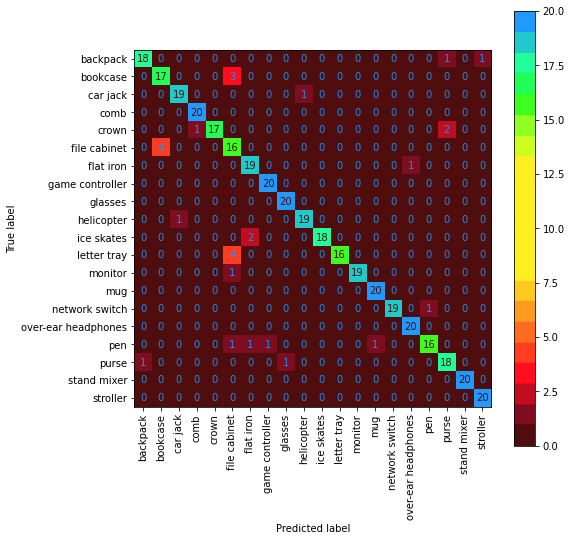

In [ ]:
rworld_net = torch.load(f'{MODELS_PATH}/baseline_rworld.pt')

rworld_net.to('cuda:0')

loss, acc, outputs, targets = test_step(rworld_net, test_product_loader, get_cost_function(), device='cuda:0')
print(f"Baseline accuracy on product domain: {acc}\n")

print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

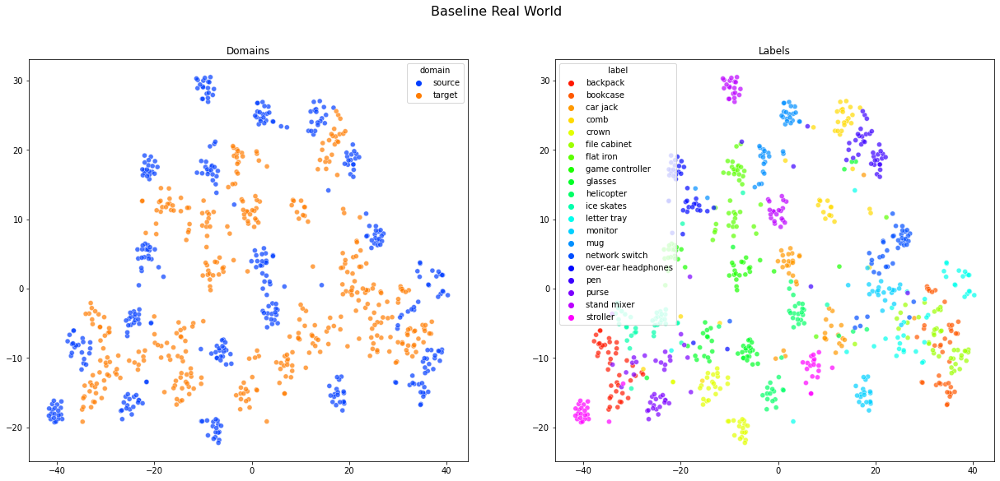

In [ ]:
plot_tsne(product_net, product_net.avgpool, test_product_loader, test_rworld_loader, "Baseline Real World")

We can easily see that the ResNet50 is already able to encode good features for the **real world domain** with respect to the **product domain**. The difference of complexity between the two domains ensures that in the **rw → p** direction the drop of the accuracy is not so big, and the features are already much representative for the categories. This means that in the opposite direction we have the exact opposite behaviour, in fact after training the network only on the product domain, the accuracy domain drops consistently.

## Upper bounds

The upper buond represents the best score we could achieve since it is the accuracy score obtained by training and testing the model on the same domain.
It implies the availability of the ground truth labels for the target domain since it is trained supervisedly.

Trained on **real world domain** and tested on **real world domain**.
It represent the upper bound for the **product → real world** shift.

Upper bound accuracy on real world domain: 93.75


                     precision    recall  f1-score   support

           backpack       0.85      0.85      0.85        20
           bookcase       0.90      0.90      0.90        20
           car jack       0.90      0.95      0.93        20
               comb       0.95      0.95      0.95        20
              crown       0.95      1.00      0.98        20
       file cabinet       0.84      0.80      0.82        20
          flat iron       1.00      0.90      0.95        20
    game controller       0.95      1.00      0.98        20
            glasses       1.00      0.95      0.97        20
         helicopter       1.00      1.00      1.00        20
         ice skates       0.95      0.90      0.92        20
        letter tray       1.00      0.90      0.95        20
            monitor       0.95      0.95      0.95        20
                mug       1.00      1.00      1.00        20
     network switch       0.87   

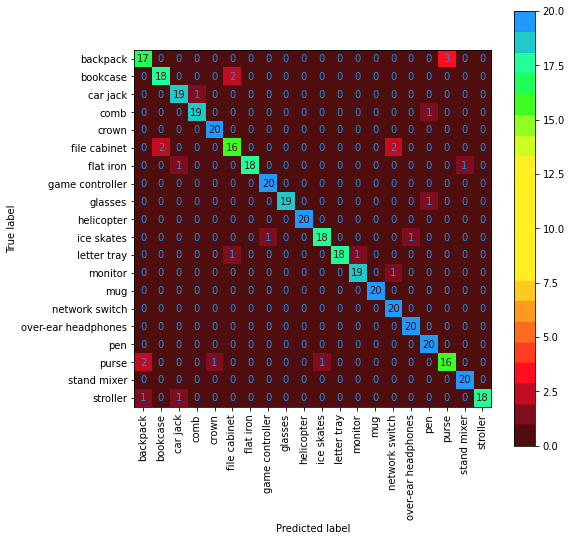

In [ ]:
rworld_net = torch.load(f'{MODELS_PATH}/baseline_rworld.pt')

rworld_net.to('cuda:0')

loss, acc, outputs, targets = test_step(rworld_net, test_rworld_loader, get_cost_function())
print(f"Upper bound accuracy on real world domain: {acc}\n")

print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

____________________________________________________________________________________________________________________________________________________________

Trained on **product domain** and tested on **product domain**.
It represent the upper bound for the **real world → product** shift.

Upper bound accuracy on product domain: 97.25


                     precision    recall  f1-score   support

           backpack       1.00      1.00      1.00        20
           bookcase       0.90      0.90      0.90        20
           car jack       1.00      1.00      1.00        20
               comb       1.00      1.00      1.00        20
              crown       1.00      0.90      0.95        20
       file cabinet       0.95      0.90      0.92        20
          flat iron       1.00      0.95      0.97        20
    game controller       0.95      1.00      0.98        20
            glasses       0.91      1.00      0.95        20
         helicopter       1.00      1.00      1.00        20
         ice skates       1.00      1.00      1.00        20
        letter tray       0.95      1.00      0.98        20
            monitor       1.00      1.00      1.00        20
                mug       0.95      1.00      0.98        20
     network switch       1.00      

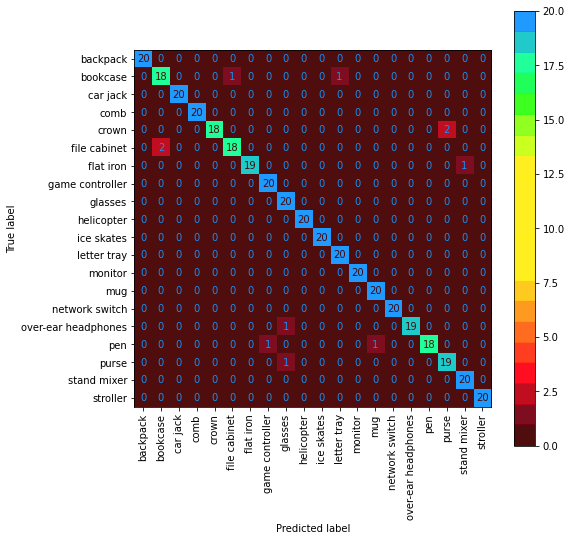

In [ ]:
product_net = torch.load(f'{MODELS_PATH}/baseline_product.pt')

product_net.to('cuda:0')

loss, acc, outputs, targets = test_step(product_net, test_product_loader, get_cost_function(), device='cuda:0')
print(f"Upper bound accuracy on product domain: {acc}\n")

print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

## DSAN implementation

### Definition of the loss

The key part of this proposal is the **lmmd loss**, which stands for ***local maximum mean discrepancy***. It compute the discrepancy between kernel mean embedding of the subdomains in source and target domains.

By doing this we are not just trying to draw near the distributions of source and target samples, but we are trying to do so for each category independently.

An important aspect is that since in UDA it is impossible to use ground truth labels for target space, we need to use the prediction.
Here is another key idea: instead of using the **argmax** of the predictions to get the *hard pseudo label*, for a single sample we use the softmax itself to weight the discrepancy in all subdomain by the probability for the sample to belong to that subdomain.
This ensures that we encorporate the natural uncertainty in the computation of the loss ($w_{i}^{sc}$ and $w_{i}^{tc}$ in the formula).

The formula is the following:

$$\hat{d}(p, q) = \frac{1}{C}\sum_{c=1}^{C}{\left\|\sum_{x_i^s \in D_s}{w_{i}^{sc}\phi(x_i^s)} - \sum_{x_j^t \in D_t}{w_{j}^{tc}\phi(x_j^t)}\right\|}^2_2$$

It can be rewritten as:

$$\hat{d}_l(p, q) = \frac{1}{C} \sum_{c=1}^C \left[ \sum_{i=1}^{|X^s|}\sum_{j=1}^{|X^s|}{w_i^{sc}w_j^{sc}k(z_i^{sl}z_j^{sl})} + \sum_{i=1}^{|X^t|}\sum_{j=1}^{|X^t|}{w_i^{tc}w_j^{tc}k(z_i^{tl}z_j^{tl})} - 2\sum_{i=1}^{|X^s|}\sum_{j=1}^{|X^t|}{w_i^{sc}w_j^{tc}k(z_i^{sl}z_j^{tl})} \right]$$

Finally, combined with the cross-entropy loss for the source samples it becomes:

$$\mathcal{L} = \mathcal{L}_C(f(X^s), y^s) + \lambda \sum_l^L \hat{d}_l(p, q)$$

Where λ is a dinamic coefficient scheduled in this way:

$$λ = \frac{2}{1+e^{-\beta*θ}}-1$$

$$θ = \frac{current\_epoch}{total\_epochs}$$

$$\beta = 10$$

By doing this the training is lead mainly by the supervised cross-entropy loss for the first epochs, until the accuracy on the target domain is enough to use the predictions to guide the **lmmd** loss

In [ ]:
class LMMD(nn.Module):
    def __init__(self, class_num=20, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
        super(LMMD, self).__init__()
        self.class_num = class_num
        self.kernel_num = kernel_num
        self.kernel_mul = kernel_mul
        self.fix_sigma = fix_sigma

    def guassian_kernel(self, source, target):
        n_samples = int(source.size()[0]) + int(target.size()[0])
        total = torch.cat([source, target], dim=0)
        source = target = None
        total0 = total.unsqueeze(0).expand(
            int(total.size(0)), int(total.size(0)), int(total.size(1)))
        total1 = total.unsqueeze(1).expand(
            int(total.size(0)), int(total.size(0)), int(total.size(1)))
        L2_distance = ((total0-total1)**2).sum(2)
        total0 = total1 = None
        if self.fix_sigma:
            bandwidth = self.fix_sigma
        else:
            bandwidth = torch.sum(L2_distance.data) / (n_samples**2-n_samples)
        bandwidth /= self.kernel_mul ** (self.kernel_num // 2)
        bandwidth_list = [bandwidth * (self.kernel_mul**i)
                          for i in range(self.kernel_num)]
        kernel_val = [torch.exp(-L2_distance / bandwidth_temp)
                      for bandwidth_temp in bandwidth_list]
        return sum(kernel_val)

    def forward(self, source, target, s_label, t_label):
        batch_size = source.size()[0]
        weight_ss, weight_tt, weight_st = self.cal_weight(
            s_label, t_label, batch_size=batch_size)
        weight_ss = torch.from_numpy(weight_ss).cuda()
        weight_tt = torch.from_numpy(weight_tt).cuda()
        weight_st = torch.from_numpy(weight_st).cuda()

        kernels = self.guassian_kernel(source, target)
        loss = torch.Tensor([0]).cuda()
        if torch.sum(torch.isnan(sum(kernels))):
            return loss
        SS = kernels[:batch_size, :batch_size]
        TT = kernels[batch_size:, batch_size:]
        ST = kernels[:batch_size, batch_size:]

        loss += torch.sum(weight_ss * SS + weight_tt * TT - 2 * weight_st * ST)
        return loss

    def convert_to_onehot(self, sca_label):
        return np.eye(self.class_num)[sca_label]

    def cal_weight(self, s_label, t_label, batch_size):
        s_sca_label = s_label.cpu().data.numpy()
        s_vec_label = self.convert_to_onehot(s_sca_label)
        s_sum = np.sum(s_vec_label, axis=0).reshape(1, self.class_num)
        s_sum[s_sum == 0] = 100
        s_vec_label = s_vec_label / s_sum

        t_sca_label = t_label.cpu().data.max(1)[1].numpy()
        t_vec_label = t_label.cpu().data.numpy()
        t_sum = np.sum(t_vec_label, axis=0).reshape(1, self.class_num)
        t_sum[t_sum == 0] = 100
        t_vec_label = t_vec_label / t_sum

        index = list(set(s_sca_label) & set(t_sca_label))
        mask_arr = np.zeros((batch_size, self.class_num))
        mask_arr[:, index] = 1
        t_vec_label = t_vec_label * mask_arr
        s_vec_label = s_vec_label * mask_arr

        weight_ss = np.matmul(s_vec_label, s_vec_label.T)
        weight_tt = np.matmul(t_vec_label, t_vec_label.T)
        weight_st = np.matmul(s_vec_label, t_vec_label.T)

        length = len(index)
        if length != 0:
            weight_ss = weight_ss / length
            weight_tt = weight_tt / length
            weight_st = weight_st / length
        else:
            weight_ss = np.array([0])
            weight_tt = np.array([0])
            weight_st = np.array([0])
        return weight_ss.astype('float32'), weight_tt.astype('float32'), weight_st.astype('float32')

In [ ]:
def getEntropy(x):
        b = F.softmax(x, dim=1) * F.log_softmax(x, dim=1)
        b = -1.0 * b.sum()
        return b

### Definition of the model

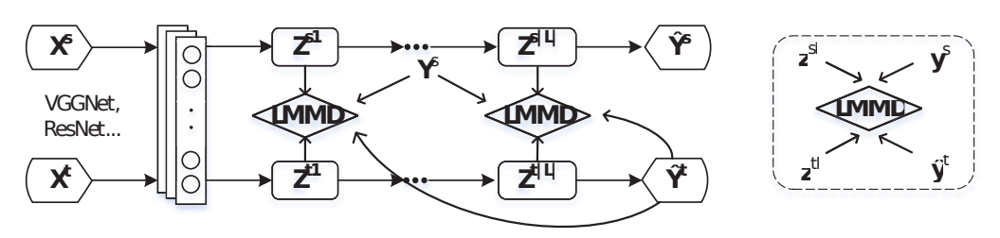

Our model is composed by the ResNet50 encoder, at top of which we add 3 fully connected layers that works as bottleneck. The first two are the ones we use to compute the discrepancy loss, while the last one is the classification layer.

We decided to use the LeakyReLU activation function after the first two fully connected layers, together with a dropout rate of .5 and batch normalization.

In [ ]:
def get_feat_size(net):
    feat_size = 0

    for im, label in train_product_loader:
        feats = net(im[0].unsqueeze(0).cuda())
        feat_size = feats.view(-1).shape
        break
    
    return feat_size.numel()

In [ ]:
class DSAN(nn.Module):
    def __init__(self, n_classes, encoder, device):
        super(DSAN, self).__init__()

        self.encoder = encoder
        feat_size = get_feat_size(encoder)

        self.loss = LMMD(n_classes)
        self.dropout = nn.Dropout(p=0.5)
        self.bn0 = nn.BatchNorm1d(feat_size)
        self.bn1 = nn.BatchNorm1d(512)
        self.bn2 = nn.BatchNorm1d(128)
        
        self.relu = nn.LeakyReLU()

        self.fc1 = nn.Linear(feat_size, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, n_classes)

        self.device = device

    def forward(self, x_source, x_target, y_source):

        # source forward
        feat_source = self.encoder(x_source)
        feat_source = torch.squeeze(feat_source)
        feat_source_bn = self.bn0(feat_source)

        feat_source1 = self.fc1(feat_source_bn)
        feat_source1 = self.relu(feat_source1)
        feat_source1_drop = self.dropout(feat_source1)
        feat_source1_drop = self.bn1(feat_source1_drop)

        feat_source2 = self.fc2(feat_source1_drop)
        feat_source2 = self.relu(feat_source2)
        feat_source2_drop = self.dropout(feat_source2)
        feat_source2_drop = self.bn2(feat_source2_drop)
        
        source_pred = self.fc3(feat_source2_drop)

        # target forward
        feat_target = self.encoder(x_target)
        feat_target = torch.squeeze(feat_target)
        feat_target_bn = self.bn0(feat_target)

        feat_target1 = self.fc1(feat_target_bn)
        feat_target1 = self.relu(feat_target1)
        feat_target1_drop = self.dropout(feat_target1)
        feat_target1_drop = self.bn1(feat_target1_drop)

        feat_target2 = self.fc2(feat_target1_drop)
        feat_target2 = self.relu(feat_target2)
        feat_target2_drop = self.dropout(feat_target2)
        feat_target2_drop = self.bn2(feat_target2_drop)

        target_pred = self.fc3(feat_target2_drop)

        y_target = F.softmax(target_pred, dim=1)

        # Coral loss
        coral_loss = self.coral(feat_source_bn, feat_target_bn)
        # lmmd losses
        lmmd_loss1 = self.loss(feat_source1, feat_target1, y_source, y_target)
        lmmd_loss2 = self.loss(feat_source2, feat_target2, y_source, y_target)

        lmmd_loss = lmmd_loss1 + lmmd_loss2

        return source_pred, lmmd_loss, y_target, coral_loss

    def inference(self, x):
        x = self.encoder(x)
        x = torch.squeeze(x)
        x = self.fc1(x)
        x = self.bn1(x)
        x = self.fc2(x)
        x = self.bn2(x)
        y = self.fc3(x)

        return y
    
    def coral(self, feature_source, feature_target):
        dim = feature_source.size(1)
        source_cov = torch.cov(feature_source)
        target_cov = torch.cov(feature_target)

        return torch.sum(torch.mul(source_cov-target_cov, source_cov-target_cov)) / (4 * dim * dim)

In [ ]:
def get_optimizer(model, lr, weight_decay):

    encoder_params = []
    other_params = []

    for name, param in model.named_parameters():
        if name.startswith('encoder'):
            encoder_params.append(param)
        else:
            other_params.append(param)
    
    # create optimizer
    optimizer = torch.optim.Adam([
        {'params': encoder_params},
        {'params': other_params, 'lr': lr},
    ], lr = lr/50, weight_decay=weight_decay)

    return optimizer

In [ ]:
def weight_init(net):
    nn.init.kaiming_normal_(net.fc1.weight.data, mode='fan_in', nonlinearity='relu')
    nn.init.constant_(net.fc1.bias.data, 0.0001)
    
    nn.init.kaiming_normal_(net.fc2.weight.data, mode='fan_in', nonlinearity='relu')
    nn.init.constant_(net.fc2.bias.data, 0.0001)

    nn.init.kaiming_normal_(net.fc3.weight.data, mode='fan_in', nonlinearity='relu')
    nn.init.constant_(net.fc3.bias.data, 0.0001)
    

In [ ]:
def split_encoder_classifier(net):
    # take all the layers but the last one
    encoder_Es_source = torch.nn.Sequential(*(list(net.children())[:-1]))
    # take last layer
    classifier_C_source = torch.nn.Sequential(list(net.children())[-1])

    return encoder_Es_source, classifier_C_source

### Training and test functions

In [ ]:
def train_DSAN_step(net, train_source_loader, train_target_loader, lambd, cost_function, optimizer, device='cuda', coral=False, print_loss=False):
    samples = 0.
    cumulative_loss = 0.
    cumulative_accuracy = 0.

    # set the network to training mode
    net.train()

    source_loader_iter = iter(train_source_loader)

    # https://stackoverflow.com/questions/51444059/how-to-iterate-over-two-dataloaders-simultaneously-using-pytorch
    for i, data in enumerate(train_target_loader):
        # gradients reset
        optimizer.zero_grad(set_to_none=True)
        # optimizer_discriminator.zero_grad()

        x_source, y_source = next(source_loader_iter)
        x_target, _ = data

        # load data into GPU
        x_source = x_source.to(device)
        y_source = y_source.to(device)
        x_target = x_target.to(device)

        # forward pass
        outputs, lmmd_loss, target_softmax, coral_loss = net(x_source, x_target, y_source)

        pseudo_loss_target = cost_function(target_softmax, torch.argmax(target_softmax, dim=1))
        loss_source = cost_function(outputs, y_source)

        lmmd_coef = 0.5
        coral_coef = 100000
        pseudo_coef = 1

        if coral:
            loss = loss_source + lambd*lmmd_loss*lmmd_coef + coral_coef*coral_loss + pseudo_coef*lambd*pseudo_loss_target
        else:
            loss = loss_source + lambd*lmmd_loss*lmmd_coef

        if print_loss:  
            print(f"\n\tλ: {lambd}")
            print(f"\tSource loss (used): {loss_source}")
            print(f"\tLMMD loss*λ*{lmmd_coef} (used): {lambd*lmmd_loss*lmmd_coef}")
            print(f"\tLMMD loss: {lmmd_loss}")
            print(f"\tCoral loss*{coral_coef} (used): {coral_loss*coral_coef}")
            print(f"\tPseudo target loss*λ*{pseudo_coef} (used): {pseudo_coef*lambd*pseudo_loss_target}")
            print(f"\tPseudo target loss: {pseudo_loss_target}")
            print_loss = False

        # backward pass
        loss.backward()
        optimizer.step()
        
        # fetch prediction and loss value
        samples += x_source.shape[0]
        cumulative_loss += loss.item()
        _, predicted = outputs.max(dim=1) # max() returns (maximum_value, index_of_maximum_value)

        # compute training accuracy
        cumulative_accuracy += predicted.eq(y_source).sum().item()

    return cumulative_loss/samples, cumulative_accuracy/samples*100

In [ ]:
def test_DSAN_step(net, data_loader, cost_function, device='cuda'):

    samples = 0.
    cumulative_loss = 0.
    cumulative_accuracy = 0.

    outputs_all = []
    targets_all = []

    # set the network to evaluation mode
    net.eval() 

    # disable gradient computation
    with torch.no_grad():

        # iterate over the test set
        for batch_idx, (inputs, targets) in enumerate(data_loader):
      
            # load data into GPU
            inputs = inputs.to(device)
            targets = targets.to(device)

            with autocast():
                # forward pass
                outputs = net.inference(inputs)

                # loss computation
                loss = cost_function(outputs, targets)

            # fetch prediction and loss value
            samples += inputs.shape[0]
            cumulative_loss += loss.item()
            _, predicted = outputs.max(dim=1)

            # compute accuracy
            cumulative_accuracy += predicted.eq(targets).sum().item()

            outputs_all.extend(predicted.cpu().tolist())
            targets_all.extend(targets.cpu().tolist())

    return cumulative_loss/samples, cumulative_accuracy/samples*100, outputs_all, targets_all

In [ ]:
def train_DSAN(train_source_loader, 
               train_target_loader,
               test_target_loader,
               visualization_name,
               use_new_resnet=False,
               resnet_size=50,
               num_classes=20,
               resnet_path=f'{MODELS_PATH}/baseline_source.pt',
               device='cuda:0', 
               learning_rate=0.001, 
               weight_decay=0.000001,
               epochs=50,
               use_patience=False,
               start_patience=3,
               log_path='/content/gdrive/MyDrive/DSAN/Logs',
               checkpoint_path='./checkpoints', # local checkpoint
               model_checkpoint_path='dsan_checkpoint.pt',
               drive_checkpoint_path='/content/gdrive/MyDrive/DSAN/checkpoints',
               save_checkpoint_every=5,
               reset=False,
               reset_patience=False,
               use_coral = True):

    # at every new run restart the logging
    vis_path = join(log_path, f'runs/{visualization_name}')
    if exists(vis_path):
        rmtree(vis_path)

    # instantiate the logger
    writer = SummaryWriter(log_dir=vis_path)

    if use_new_resnet:
        get_lambda = lambda epoch, epochs: (2/(1+np.exp(-10*epoch/epochs)))-1
        resnet = init_resnet(n_classes=num_classes, size=resnet_size).to(device)
    else:
        # load resnet
        get_lambda = lambda epoch, epochs: 1/(1+np.exp(-10*epoch/epochs))
        resnet = torch.load(resnet_path)
    
    encoder, _ = split_encoder_classifier(resnet)
    encoder = encoder.to(device)

    net = DSAN(num_classes, encoder, device)
    net = net.to(device)

    # instantiate the optimizer
    optimizer = get_optimizer(net, learning_rate, weight_decay)
    
    # instantiates the cost functions
    cost_function = get_cost_function()

    best_acc = 0
    patience = start_patience
    start_epoch = 0

    # delete checkpoints and start from zero 
    if reset:
        if exists(join(checkpoint_path, model_checkpoint_path)):
            remove(join(checkpoint_path, model_checkpoint_path))
        if exists(join(drive_checkpoint_path, model_checkpoint_path)):
            remove(join(drive_checkpoint_path, model_checkpoint_path))
    
    checkpoint = None
    # check local checkpoint folder and create it if not present
    if not os.path.exists(checkpoint_path):
        print(f"[*] Local checkpoint folder not found [{checkpoint_path}]")
        os.mkdir(checkpoint_path)
    else:
        print("[*] Local checkpoint folder found")
        checkpoint = checkpoint_path
    
    # check drive checkpoint folder and create it if not present
    if drive_checkpoint_path:
        if not os.path.exists(drive_checkpoint_path):
            print(f"[*] Drive checkpoint folder not found [{drive_checkpoint_path}]")
            os.mkdir(drive_checkpoint_path)
        else:
            print("[*] Drive checkpoint folder found")
            checkpoint = drive_checkpoint_path
    else:
        print("[*] Drive checkpoint path argument not present (drive_checkpoint_path)")

    # load checkpoints. Priority is given to drive folder
    if checkpoint:
        print("[*] Restoring checkpoints")

        try:
            model_checkpoint = torch.load(join(checkpoint, model_checkpoint_path))
            net.load_state_dict(model_checkpoint['model_state_dict'])
            optimizer.load_state_dict(model_checkpoint['optimizer_state_dict'])

            patience = model_checkpoint['patience']
            start_epoch = model_checkpoint['epoch'] + 1
            best_acc = model_checkpoint['best_acc']

            if reset_patience:
                patience = start_patience

            model_checkpoint = None
            
        except FileNotFoundError:
            print("[*] Checkpoint files not found. Starting from zero")
    
    # iterate through epochs
    for epoch in tqdm(range(start_epoch, epochs)):
        lambd = get_lambda(min(epoch, 50), 50)

        # debug stuff
        if (epoch+1) % 5 == 0:
            print_loss = False
        else:
            print_loss = False

        train_loss, train_accuracy = train_DSAN_step(net, train_source_loader, train_target_loader, lambd, cost_function, optimizer, print_loss=print_loss,coral = use_coral)

        test_loss, test_accuracy, _, _ = test_DSAN_step(net, test_target_loader, cost_function)

        print("\n")
        print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
        print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))

        writer.add_scalar('Loss/train_loss', train_loss, epoch + 1)
        writer.add_scalar('Loss/test_loss', test_loss, epoch + 1)
        writer.add_scalar('Accuracy/train_accuracy', train_accuracy, epoch + 1)
        writer.add_scalar('Accuracy/test_accuracy', test_accuracy, epoch + 1)

        # update patience for early stopping
        if use_patience:
            if test_accuracy > best_acc:
                best_acc = test_accuracy
                patience += 1 if patience < start_patience else 0
            elif test_accuracy < (best_acc - 0.25):
                patience -= 1

            print('\t Patience: {}'.format(patience))
            print('-----------------------------------------------------')

            if patience == 0:
                print(f"Patience at 0. Stopping training")
                break
        
        # save checkpoint every save_checkpoint_every epoch
        if (epoch + 1) % save_checkpoint_every == 0:
            print("[*] Saving checkpoints")
            
            torch.save({
                'epoch': epoch,
                'model_state_dict': net.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'patience': patience,
                'best_acc': best_acc,
                }, join(checkpoint_path, model_checkpoint_path))
            
            if drive_checkpoint_path:
                copyfile(join(checkpoint_path, model_checkpoint_path), join(drive_checkpoint_path, model_checkpoint_path))

    print('After training:')
    train_loss, train_accuracy, _, _ = test_DSAN_step(net, train_source_loader, cost_function)
    test_loss, test_accuracy, _, _ = test_DSAN_step(net, test_target_loader, cost_function)

    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')

    # close the logger
    writer.close()

    return net

### Product → real world 

#### DSAN 
domain invariant model training for **product → real world** shift

In [ ]:
dsan = train_DSAN(train_product_loader_notAug, train_rworld_loader_notAug, test_rworld_loader, resnet_size=50, visualization_name='DSAN_resnet_50_not_pretrained_p-rw', use_new_resnet=True, 
               resnet_path=f'{MODELS_PATH}/baseline_product.pt', learning_rate=0.0001, weight_decay=5e-4, epochs=50, use_patience=False, start_patience=3, model_checkpoint_path='dsan_checkpoint_p-rw.pt',reset=False, reset_patience=True,use_coral = False)

[*] Local checkpoint folder found
[*] Drive checkpoint folder found
[*] Restoring checkpoints
[*] Checkpoint files not found. Starting from zero


  2%|▏         | 1/50 [01:44<1:25:35, 104.81s/it]



	 Training loss 2.80868, Training accuracy 15.88
	 Test loss 2.71983, Test accuracy 18.00


  4%|▍         | 2/50 [03:31<1:24:57, 106.20s/it]



	 Training loss 2.55521, Training accuracy 43.56
	 Test loss 2.48359, Test accuracy 24.00


  6%|▌         | 3/50 [05:18<1:23:11, 106.20s/it]



	 Training loss 2.49813, Training accuracy 62.38
	 Test loss 2.28412, Test accuracy 33.25


  8%|▊         | 4/50 [07:03<1:21:08, 105.83s/it]



	 Training loss 2.53363, Training accuracy 72.19
	 Test loss 2.16080, Test accuracy 38.00


	 Training loss 2.58739, Training accuracy 79.00
	 Test loss 2.04940, Test accuracy 43.75
[*] Saving checkpoints


 12%|█▏        | 6/50 [10:40<1:18:37, 107.21s/it]



	 Training loss 2.65770, Training accuracy 83.38
	 Test loss 1.93238, Test accuracy 51.25


 14%|█▍        | 7/50 [12:25<1:16:17, 106.46s/it]



	 Training loss 2.73978, Training accuracy 85.19
	 Test loss 1.83129, Test accuracy 56.50


 16%|█▌        | 8/50 [14:12<1:14:40, 106.67s/it]



	 Training loss 2.77970, Training accuracy 89.06
	 Test loss 1.78337, Test accuracy 57.75


 18%|█▊        | 9/50 [15:59<1:12:57, 106.78s/it]



	 Training loss 2.84194, Training accuracy 89.62
	 Test loss 1.68028, Test accuracy 60.00


	 Training loss 2.85896, Training accuracy 91.06
	 Test loss 1.63461, Test accuracy 62.50
[*] Saving checkpoints


 22%|██▏       | 11/50 [19:34<1:09:36, 107.09s/it]



	 Training loss 2.88342, Training accuracy 91.81
	 Test loss 1.52696, Test accuracy 64.50


 24%|██▍       | 12/50 [21:20<1:07:47, 107.03s/it]



	 Training loss 2.88593, Training accuracy 92.44
	 Test loss 1.48600, Test accuracy 65.00


 26%|██▌       | 13/50 [23:06<1:05:41, 106.52s/it]



	 Training loss 2.89645, Training accuracy 91.69
	 Test loss 1.41779, Test accuracy 68.50


 28%|██▊       | 14/50 [24:53<1:04:07, 106.86s/it]



	 Training loss 2.88323, Training accuracy 93.81
	 Test loss 1.36126, Test accuracy 70.00


	 Training loss 2.84562, Training accuracy 94.94
	 Test loss 1.31683, Test accuracy 71.25
[*] Saving checkpoints


 32%|███▏      | 16/50 [28:30<1:00:49, 107.33s/it]



	 Training loss 2.83676, Training accuracy 95.94
	 Test loss 1.26365, Test accuracy 72.50


 34%|███▍      | 17/50 [30:16<58:57, 107.19s/it]  



	 Training loss 2.82275, Training accuracy 96.50
	 Test loss 1.20535, Test accuracy 74.50


 36%|███▌      | 18/50 [32:04<57:10, 107.21s/it]



	 Training loss 2.79849, Training accuracy 96.12
	 Test loss 1.18152, Test accuracy 76.25


 38%|███▊      | 19/50 [33:48<55:00, 106.48s/it]



	 Training loss 2.77776, Training accuracy 96.69
	 Test loss 1.10642, Test accuracy 79.00


	 Training loss 2.77541, Training accuracy 96.06
	 Test loss 1.06673, Test accuracy 80.25
[*] Saving checkpoints


 42%|████▏     | 21/50 [37:25<51:52, 107.32s/it]



	 Training loss 2.71651, Training accuracy 97.88
	 Test loss 1.01892, Test accuracy 79.75


 44%|████▍     | 22/50 [39:11<49:57, 107.06s/it]



	 Training loss 2.71142, Training accuracy 96.88
	 Test loss 0.98675, Test accuracy 80.75


 46%|████▌     | 23/50 [40:56<47:52, 106.38s/it]



	 Training loss 2.69275, Training accuracy 96.31
	 Test loss 0.95421, Test accuracy 83.00


 48%|████▊     | 24/50 [42:43<46:08, 106.49s/it]



	 Training loss 2.65817, Training accuracy 97.25
	 Test loss 0.87688, Test accuracy 83.00


	 Training loss 2.63659, Training accuracy 98.12
	 Test loss 0.88769, Test accuracy 83.75
[*] Saving checkpoints


 52%|█████▏    | 26/50 [46:18<42:49, 107.07s/it]



	 Training loss 2.61223, Training accuracy 97.75
	 Test loss 0.84756, Test accuracy 83.50


 54%|█████▍    | 27/50 [48:05<41:01, 107.02s/it]



	 Training loss 2.59601, Training accuracy 98.19
	 Test loss 0.84652, Test accuracy 84.25


 56%|█████▌    | 28/50 [49:50<38:56, 106.22s/it]



	 Training loss 2.55657, Training accuracy 98.25
	 Test loss 0.79962, Test accuracy 86.25


 58%|█████▊    | 29/50 [51:36<37:11, 106.28s/it]



	 Training loss 2.55992, Training accuracy 98.12
	 Test loss 0.78569, Test accuracy 86.00


	 Training loss 2.54788, Training accuracy 98.69
	 Test loss 0.77012, Test accuracy 87.00
[*] Saving checkpoints


 62%|██████▏   | 31/50 [55:10<33:40, 106.36s/it]



	 Training loss 2.52133, Training accuracy 98.44
	 Test loss 0.74955, Test accuracy 86.50


 64%|██████▍   | 32/50 [56:55<31:47, 105.97s/it]



	 Training loss 2.50961, Training accuracy 98.38
	 Test loss 0.71284, Test accuracy 86.50


 66%|██████▌   | 33/50 [58:41<30:03, 106.10s/it]



	 Training loss 2.47065, Training accuracy 98.69
	 Test loss 0.70840, Test accuracy 88.25


 68%|██████▊   | 34/50 [1:00:27<28:18, 106.18s/it]



	 Training loss 2.48624, Training accuracy 98.50
	 Test loss 0.68064, Test accuracy 86.75


	 Training loss 2.45703, Training accuracy 99.19
	 Test loss 0.66471, Test accuracy 87.75
[*] Saving checkpoints


 72%|███████▏  | 36/50 [1:04:01<24:49, 106.39s/it]



	 Training loss 2.44950, Training accuracy 98.25
	 Test loss 0.66855, Test accuracy 86.00


 74%|███████▍  | 37/50 [1:05:47<23:01, 106.29s/it]



	 Training loss 2.41970, Training accuracy 99.00
	 Test loss 0.63890, Test accuracy 88.25


 76%|███████▌  | 38/50 [1:07:31<21:10, 105.84s/it]



	 Training loss 2.40458, Training accuracy 99.25
	 Test loss 0.61538, Test accuracy 87.00


 78%|███████▊  | 39/50 [1:09:17<19:23, 105.79s/it]



	 Training loss 2.39742, Training accuracy 99.06
	 Test loss 0.59230, Test accuracy 88.75


	 Training loss 2.40416, Training accuracy 98.81
	 Test loss 0.59200, Test accuracy 88.75
[*] Saving checkpoints


 82%|████████▏ | 41/50 [1:12:51<15:57, 106.36s/it]



	 Training loss 2.38196, Training accuracy 99.25
	 Test loss 0.60174, Test accuracy 87.75


 84%|████████▍ | 42/50 [1:14:36<14:05, 105.75s/it]



	 Training loss 2.37636, Training accuracy 99.12
	 Test loss 0.58370, Test accuracy 88.25


 86%|████████▌ | 43/50 [1:16:22<12:20, 105.83s/it]



	 Training loss 2.37693, Training accuracy 98.75
	 Test loss 0.54988, Test accuracy 88.25


 88%|████████▊ | 44/50 [1:18:08<10:35, 105.90s/it]



	 Training loss 2.34531, Training accuracy 99.31
	 Test loss 0.52138, Test accuracy 89.50


	 Training loss 2.36010, Training accuracy 99.25
	 Test loss 0.57365, Test accuracy 87.75
[*] Saving checkpoints


 92%|█████████▏| 46/50 [1:21:49<07:14, 108.71s/it]



	 Training loss 2.34966, Training accuracy 99.06
	 Test loss 0.51525, Test accuracy 89.75


 94%|█████████▍| 47/50 [1:23:35<05:24, 108.05s/it]



	 Training loss 2.33703, Training accuracy 99.31
	 Test loss 0.50413, Test accuracy 88.75


 96%|█████████▌| 48/50 [1:25:22<03:35, 107.64s/it]



	 Training loss 2.33967, Training accuracy 99.19
	 Test loss 0.51394, Test accuracy 89.00


 98%|█████████▊| 49/50 [1:27:07<01:46, 106.70s/it]



	 Training loss 2.32047, Training accuracy 99.25
	 Test loss 0.53402, Test accuracy 89.00


	 Training loss 2.31626, Training accuracy 99.06
	 Test loss 0.48166, Test accuracy 90.00
[*] Saving checkpoints


100%|██████████| 50/50 [1:28:55<00:00, 106.72s/it]

After training:


	 Training loss 0.10762, Training accuracy 99.06
	 Test loss 0.48166, Test accuracy 90.00
-----------------------------------------------------


In [ ]:
dsan = dsan.to('cpu')
torch.save(dsan, f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_p-rw.pt')

In [ ]:
torch.cuda.empty_cache()

Our model accuracy on real world domain: 90.0


                     precision    recall  f1-score   support

           backpack       0.71      1.00      0.83        20
           bookcase       1.00      0.80      0.89        20
           car jack       0.91      1.00      0.95        20
               comb       1.00      0.80      0.89        20
              crown       1.00      0.90      0.95        20
       file cabinet       0.84      0.80      0.82        20
          flat iron       0.83      0.95      0.88        20
    game controller       0.83      1.00      0.91        20
            glasses       0.94      0.75      0.83        20
         helicopter       0.95      0.90      0.92        20
         ice skates       0.94      0.85      0.89        20
        letter tray       0.83      1.00      0.91        20
            monitor       0.94      0.85      0.89        20
                mug       1.00      0.85      0.92        20
     network switch       0.90      

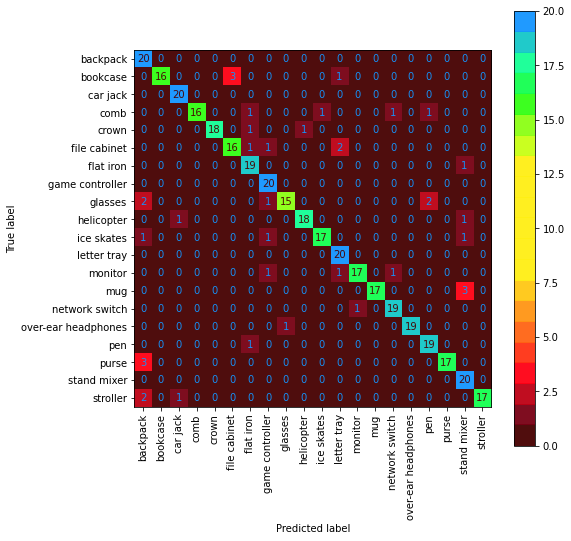

In [ ]:
dsan = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_p-rw.pt')

dsan.to('cuda:0')

loss, acc, outputs, targets = test_DSAN_step(dsan, test_rworld_loader, get_cost_function())
print(f"Our model accuracy on real world domain: {acc}\n")

print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

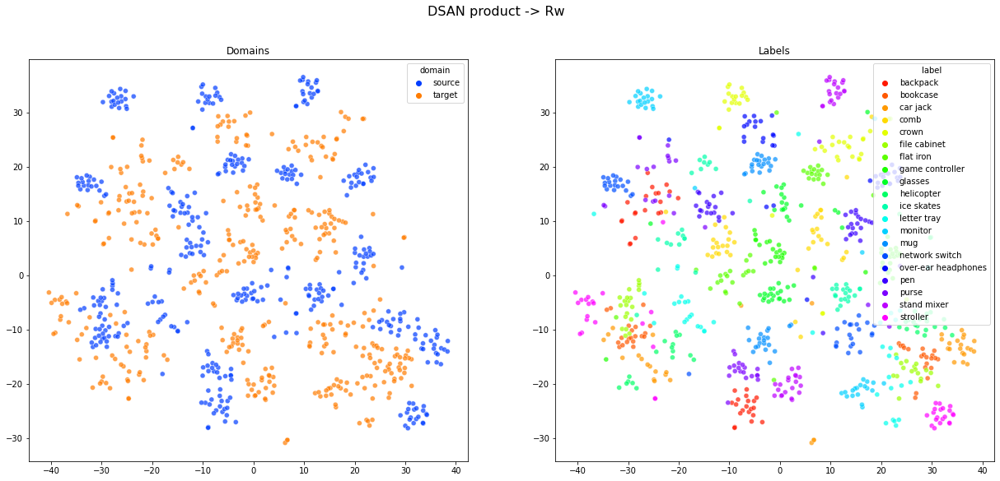

In [ ]:
plot_tsne(dsan, dsan.encoder[8], test_product_loader, test_rworld_loader, "DSAN product -> Rw", dsan=True)

#### DSAN with resnet pretrained for baseline
domain invariant model training for **product → real world** shift

Here we tried a slightly different approach: instead of training the model from scratch, what happens if we train it starting from the model trained for the baseline (hence of the source domain only)? 

As expected the performance are lower, since it has to learn not to discriminate between two domains from a biased starting point.
The positive side is that it requires less than half epochs to reach convergence, in our small scale case it may not be a huge difference, but is some situation in could be convenient having slightly worse accuracy and being able to train the model in much less time. 

In [ ]:
dsan = train_DSAN(train_product_loader_notAug, train_rworld_loader_notAug, test_rworld_loader, resnet_size=50, visualization_name='DSAN_resnet_50_pretrained_p-rw', use_new_resnet=False, 
               resnet_path=f'{MODELS_PATH}/baseline_product.pt', learning_rate=0.0001, weight_decay=5e-4, epochs=25, use_patience=False, start_patience=3, model_checkpoint_path='dsan_checkpoint_pretrained_p-rw.pt',reset=True, reset_patience=True,use_coral = False)

[*] Local checkpoint folder found
[*] Drive checkpoint folder found
[*] Restoring checkpoints
[*] Checkpoint files not found. Starting from zero


  4%|▍         | 1/25 [01:45<42:02, 105.08s/it]



	 Training loss 3.07926, Training accuracy 8.25
	 Test loss 2.88030, Test accuracy 10.00


  8%|▊         | 2/25 [03:24<38:58, 101.68s/it]



	 Training loss 2.72977, Training accuracy 20.19
	 Test loss 2.56862, Test accuracy 26.50


 12%|█▏        | 3/25 [05:07<37:29, 102.27s/it]



	 Training loss 2.43553, Training accuracy 36.06
	 Test loss 2.31227, Test accuracy 47.25


 16%|█▌        | 4/25 [06:46<35:22, 101.08s/it]



	 Training loss 2.23135, Training accuracy 50.62
	 Test loss 2.12947, Test accuracy 59.25


	 Training loss 2.03849, Training accuracy 62.31
	 Test loss 1.97212, Test accuracy 68.00
[*] Saving checkpoints


 24%|██▍       | 6/25 [10:12<32:16, 101.90s/it]



	 Training loss 1.88058, Training accuracy 72.25
	 Test loss 1.86568, Test accuracy 70.75


 28%|██▊       | 7/25 [11:55<30:43, 102.40s/it]



	 Training loss 1.77063, Training accuracy 78.31
	 Test loss 1.78369, Test accuracy 73.50


 32%|███▏      | 8/25 [13:35<28:47, 101.63s/it]



	 Training loss 1.68120, Training accuracy 82.81
	 Test loss 1.68902, Test accuracy 74.50


 36%|███▌      | 9/25 [15:15<26:54, 100.93s/it]



	 Training loss 1.58246, Training accuracy 88.50
	 Test loss 1.61000, Test accuracy 78.50


	 Training loss 1.51449, Training accuracy 89.56
	 Test loss 1.53508, Test accuracy 81.00
[*] Saving checkpoints


 44%|████▍     | 11/25 [18:40<23:43, 101.67s/it]



	 Training loss 1.46101, Training accuracy 90.12
	 Test loss 1.48146, Test accuracy 82.00


 48%|████▊     | 12/25 [20:20<21:52, 100.99s/it]



	 Training loss 1.39117, Training accuracy 92.81
	 Test loss 1.45719, Test accuracy 81.50


 52%|█████▏    | 13/25 [22:03<20:18, 101.58s/it]



	 Training loss 1.34628, Training accuracy 93.62
	 Test loss 1.40927, Test accuracy 82.50


 56%|█████▌    | 14/25 [23:42<18:29, 100.88s/it]



	 Training loss 1.29949, Training accuracy 94.69
	 Test loss 1.37737, Test accuracy 82.25


	 Training loss 1.28859, Training accuracy 94.81
	 Test loss 1.31046, Test accuracy 85.00
[*] Saving checkpoints


 64%|██████▍   | 16/25 [27:07<15:13, 101.48s/it]



	 Training loss 1.23566, Training accuracy 95.44
	 Test loss 1.31435, Test accuracy 83.50


 68%|██████▊   | 17/25 [28:47<13:27, 100.91s/it]



	 Training loss 1.21069, Training accuracy 96.12
	 Test loss 1.28379, Test accuracy 84.25


 72%|███████▏  | 18/25 [30:29<11:50, 101.46s/it]



	 Training loss 1.15341, Training accuracy 97.12
	 Test loss 1.24168, Test accuracy 85.25


 76%|███████▌  | 19/25 [32:09<10:04, 100.79s/it]



	 Training loss 1.12284, Training accuracy 97.50
	 Test loss 1.23256, Test accuracy 84.00


	 Training loss 1.11358, Training accuracy 97.94
	 Test loss 1.21346, Test accuracy 84.25
[*] Saving checkpoints


 84%|████████▍ | 21/25 [35:34<06:47, 101.80s/it]



	 Training loss 1.09452, Training accuracy 98.00
	 Test loss 1.18970, Test accuracy 85.25


 88%|████████▊ | 22/25 [37:13<05:02, 101.00s/it]



	 Training loss 1.07227, Training accuracy 97.19
	 Test loss 1.17450, Test accuracy 85.75


 92%|█████████▏| 23/25 [38:55<03:22, 101.47s/it]



	 Training loss 1.05291, Training accuracy 98.12
	 Test loss 1.13553, Test accuracy 85.50


 96%|█████████▌| 24/25 [40:34<01:40, 100.69s/it]



	 Training loss 1.03723, Training accuracy 98.31
	 Test loss 1.14115, Test accuracy 84.25


	 Training loss 1.02147, Training accuracy 97.88
	 Test loss 1.08807, Test accuracy 84.75
[*] Saving checkpoints


100%|██████████| 25/25 [42:15<00:00, 101.44s/it]

After training:


	 Training loss 0.35599, Training accuracy 99.75
	 Test loss 1.08807, Test accuracy 84.75
-----------------------------------------------------


In [ ]:
dsan = dsan.to('cpu')
torch.save(dsan, f'{MODELS_PATH}/DSAN_resnet_50_pretrained_p-rw.pt')

In [ ]:
torch.cuda.empty_cache()

Our model accuracy on real world domain: 84.75


                     precision    recall  f1-score   support

           backpack       0.88      0.70      0.78        20
           bookcase       1.00      0.90      0.95        20
           car jack       0.63      0.95      0.76        20
               comb       0.81      0.85      0.83        20
              crown       0.95      0.90      0.92        20
       file cabinet       0.94      0.75      0.83        20
          flat iron       0.89      0.85      0.87        20
    game controller       0.95      0.95      0.95        20
            glasses       1.00      0.75      0.86        20
         helicopter       1.00      0.75      0.86        20
         ice skates       0.94      0.80      0.86        20
        letter tray       0.68      0.95      0.79        20
            monitor       0.65      0.85      0.74        20
                mug       1.00      0.80      0.89        20
     network switch       0.85     

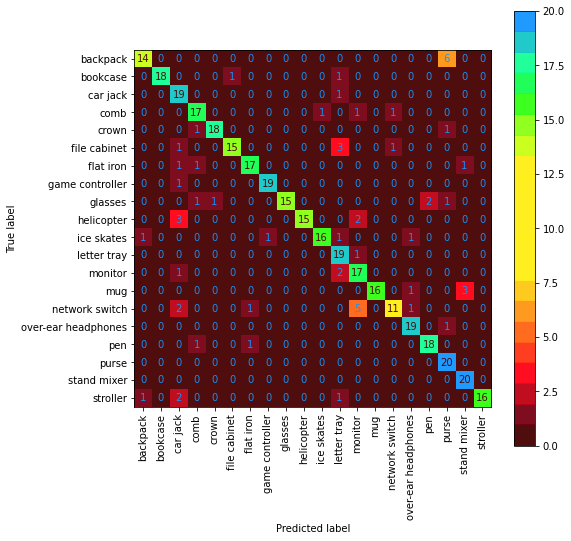

In [ ]:
dsan = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_pretrained_p-rw.pt')

dsan.to('cuda:0')

loss, acc, outputs, targets = test_DSAN_step(dsan, test_rworld_loader, get_cost_function())
print(f"Our model accuracy on real world domain: {acc}\n")

print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

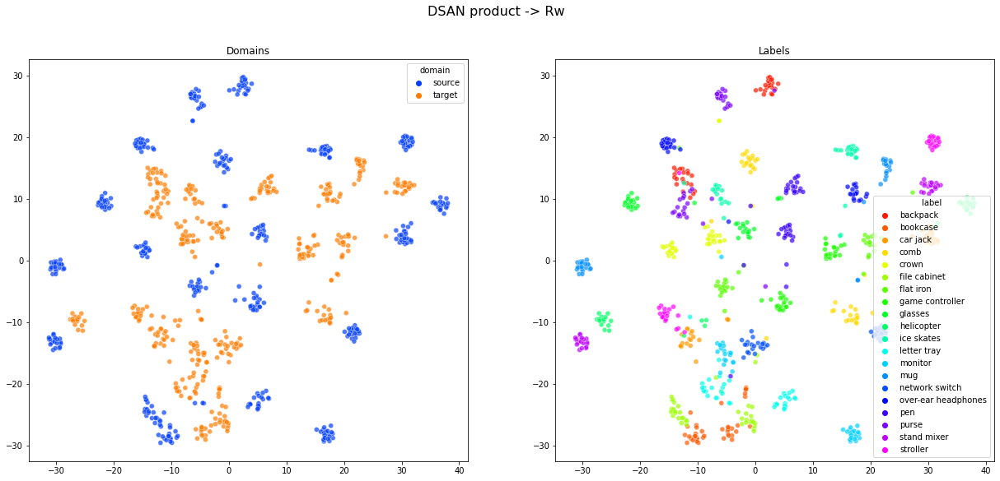

In [ ]:
plot_tsne(dsan, dsan.encoder[8], test_product_loader, test_rworld_loader, "DSAN product -> Rw", dsan=True)

#### DSAN + Coral loss
domain invariant model training for **product → real world** shift

This is our improvement of the model, not described in the paper.
We decided to add a global discrepancy loss, called CORAL (correlation allignment).

To compute this loss we retrieve the feature vector coming from the encoder and calculate the squared difference of the covariance matrices.

The formula is the following

$$\mathcal{L}_{CORAL} = \frac{1}{4d^2}\left\| C^s - C^t \right\|^2$$

We also observed that the **lmmd loss** tends to work until a certain point during the training, but in order to reach convergence at a certain point the prediction of the target domain tends to get worse and worse. We believe this happen because when the model it is not able to lower the loss through the domain discrepancy, it tries doing so by acting on the predictions, that are used inside the loss to weight it.

We discovered that by adding a self-supervised cross-entropy loss via hard labels, we can prevent this to happen, and so push a little further the training and reach better results.

In [ ]:
dsan = train_DSAN(train_product_loader_notAug, train_rworld_loader_notAug, test_rworld_loader, resnet_size=50, visualization_name='DSAN_resnet_50_not_pretrained_p-rw_wcoral', use_new_resnet=True, 
               resnet_path=f'{MODELS_PATH}/baseline_product.pt', learning_rate=0.0001, weight_decay=5e-4, epochs=50, use_patience=False, start_patience=3, model_checkpoint_path='dsan_checkpoint_p-rw_wcoral.pt',reset=False, reset_patience=True)

[*] Local checkpoint folder found
[*] Drive checkpoint folder found
[*] Restoring checkpoints
0it [00:00, ?it/s]After training:

         Training loss 0.10015, Training accuracy 98.81
         Test loss 0.42935, Test accuracy 91.75
-----------------------------------------------------


In [ ]:
dsan = dsan.to('cpu')
torch.save(dsan, f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_p-rw_wcoral.pt')

In [ ]:
torch.cuda.empty_cache()

Our model accuracy on real world domain: 91.75


                     precision    recall  f1-score   support

           backpack       0.89      0.85      0.87        20
           bookcase       0.95      0.90      0.92        20
           car jack       0.87      1.00      0.93        20
               comb       1.00      0.90      0.95        20
              crown       1.00      0.95      0.97        20
       file cabinet       0.86      0.90      0.88        20
          flat iron       0.86      0.90      0.88        20
    game controller       0.95      0.95      0.95        20
            glasses       0.90      0.95      0.93        20
         helicopter       0.95      0.95      0.95        20
         ice skates       0.89      0.85      0.87        20
        letter tray       0.84      0.80      0.82        20
            monitor       0.94      0.85      0.89        20
                mug       1.00      0.90      0.95        20
     network switch       0.95     

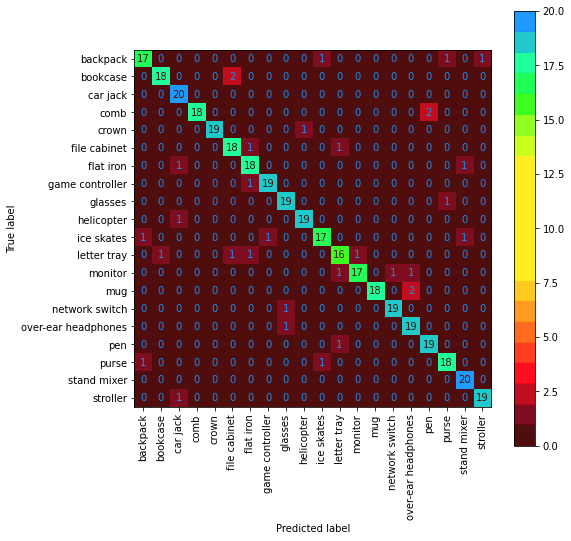

In [ ]:
dsan = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_p-rw_wcoral.pt')

dsan.to('cuda:0')

loss, acc, outputs, targets = test_DSAN_step(dsan, test_rworld_loader, get_cost_function())
print(f"Our model accuracy on real world domain: {acc}\n")

print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

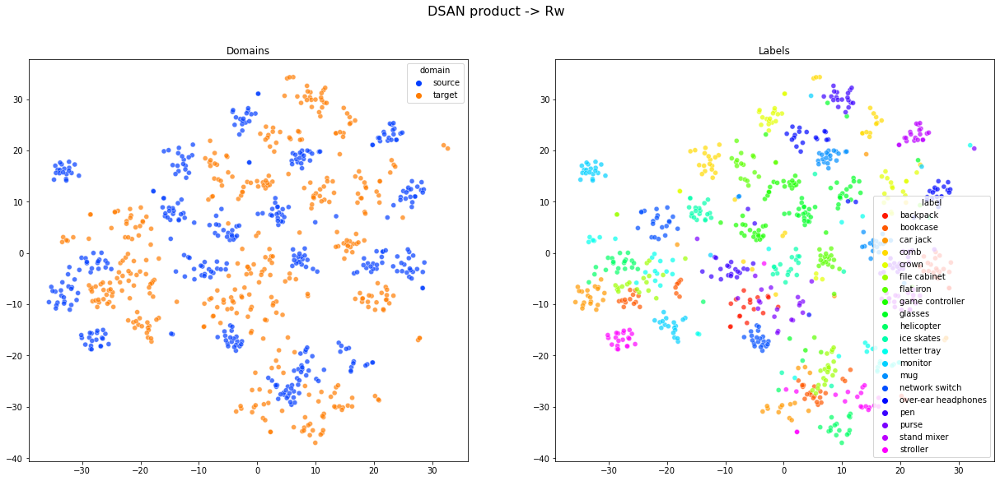

In [ ]:
plot_tsne(dsan, dsan.encoder[8], test_product_loader, test_rworld_loader, "DSAN product -> Rw", dsan=True)

### Real world → product

#### DSAN 
domain invariant model training for **real world → product** shift

In [ ]:
dsan = train_DSAN(train_rworld_loader_notAug, train_product_loader_notAug, test_product_loader, resnet_size=50, visualization_name='DSAN_resnet_50_not_pretrained_rw-p', use_new_resnet=True, 
               resnet_path=f'{MODELS_PATH}/baseline_rworld.pt', learning_rate=0.0001, weight_decay=5e-4, epochs=50, use_patience=False, start_patience=3, model_checkpoint_path='dsan_checkpoint_rw-p.pt',reset=False, reset_patience=True,use_coral = False)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

[*] Local checkpoint folder not found [./checkpoints]
[*] Drive checkpoint folder found
[*] Restoring checkpoints


  2%|▎         | 1/40 [01:58<1:17:17, 118.91s/it]



	 Training loss 1.01747, Training accuracy 88.06
	 Test loss 1.08081, Test accuracy 93.00


  5%|▌         | 2/40 [03:48<1:11:55, 113.57s/it]



	 Training loss 0.96665, Training accuracy 89.44
	 Test loss 1.02214, Test accuracy 93.50


  8%|▊         | 3/40 [05:38<1:09:04, 112.01s/it]



	 Training loss 0.89439, Training accuracy 90.94
	 Test loss 1.00814, Test accuracy 93.50


 10%|█         | 4/40 [07:21<1:04:55, 108.22s/it]



	 Training loss 0.83689, Training accuracy 91.81
	 Test loss 0.92803, Test accuracy 93.75


	 Training loss 0.80155, Training accuracy 92.75
	 Test loss 0.89193, Test accuracy 93.50
[*] Saving checkpoints


 15%|█▌        | 6/40 [11:22<1:05:17, 115.21s/it]



	 Training loss 0.74139, Training accuracy 92.44
	 Test loss 0.84926, Test accuracy 94.00


 18%|█▊        | 7/40 [13:12<1:02:27, 113.57s/it]



	 Training loss 0.71615, Training accuracy 92.88
	 Test loss 0.83885, Test accuracy 94.75


 20%|██        | 8/40 [15:09<1:01:12, 114.77s/it]



	 Training loss 0.66435, Training accuracy 94.81
	 Test loss 0.79993, Test accuracy 95.00


 22%|██▎       | 9/40 [17:04<59:16, 114.72s/it]  



	 Training loss 0.63471, Training accuracy 94.38
	 Test loss 0.75733, Test accuracy 94.25


	 Training loss 0.58446, Training accuracy 95.56
	 Test loss 0.75509, Test accuracy 94.50
[*] Saving checkpoints


 28%|██▊       | 11/40 [20:19<51:03, 105.64s/it]



	 Training loss 0.56144, Training accuracy 95.44
	 Test loss 0.70604, Test accuracy 94.75


 30%|███       | 12/40 [21:54<47:49, 102.48s/it]



	 Training loss 0.52440, Training accuracy 96.88
	 Test loss 0.68251, Test accuracy 94.75


 32%|███▎      | 13/40 [23:29<45:03, 100.12s/it]



	 Training loss 0.51662, Training accuracy 96.50
	 Test loss 0.63655, Test accuracy 93.75


 35%|███▌      | 14/40 [25:04<42:44, 98.63s/it] 



	 Training loss 0.47533, Training accuracy 96.88
	 Test loss 0.62702, Test accuracy 94.75


	 Training loss 0.45261, Training accuracy 96.81
	 Test loss 0.61080, Test accuracy 94.50
[*] Saving checkpoints


 40%|████      | 16/40 [28:16<38:52, 97.19s/it]



	 Training loss 0.44589, Training accuracy 97.38
	 Test loss 0.57451, Test accuracy 94.50


 42%|████▎     | 17/40 [29:51<36:59, 96.48s/it]



	 Training loss 0.39830, Training accuracy 98.12
	 Test loss 0.58334, Test accuracy 95.25


 45%|████▌     | 18/40 [31:26<35:11, 95.99s/it]



	 Training loss 0.38087, Training accuracy 97.75
	 Test loss 0.54105, Test accuracy 94.50


 48%|████▊     | 19/40 [33:00<33:27, 95.61s/it]



	 Training loss 0.38323, Training accuracy 97.50
	 Test loss 0.54783, Test accuracy 95.00


	 Training loss 0.36318, Training accuracy 97.50
	 Test loss 0.51700, Test accuracy 94.50
[*] Saving checkpoints


 52%|█████▎    | 21/40 [36:12<30:17, 95.64s/it]



	 Training loss 0.34292, Training accuracy 98.62
	 Test loss 0.51248, Test accuracy 94.75


 55%|█████▌    | 22/40 [37:47<28:36, 95.38s/it]



	 Training loss 0.32648, Training accuracy 98.44
	 Test loss 0.50174, Test accuracy 93.75


 57%|█████▊    | 23/40 [39:21<26:56, 95.09s/it]



	 Training loss 0.31742, Training accuracy 98.06
	 Test loss 0.48998, Test accuracy 94.25


 60%|██████    | 24/40 [40:56<25:19, 94.98s/it]



	 Training loss 0.30530, Training accuracy 98.50
	 Test loss 0.48060, Test accuracy 94.00


	 Training loss 0.29377, Training accuracy 98.50
	 Test loss 0.45959, Test accuracy 94.25
[*] Saving checkpoints


 65%|██████▌   | 26/40 [44:07<22:13, 95.26s/it]



	 Training loss 0.28544, Training accuracy 98.81
	 Test loss 0.45449, Test accuracy 93.50


 68%|██████▊   | 27/40 [45:42<20:37, 95.19s/it]



	 Training loss 0.28958, Training accuracy 98.31
	 Test loss 0.44143, Test accuracy 93.75


 70%|███████   | 28/40 [47:17<19:00, 95.02s/it]



	 Training loss 0.25808, Training accuracy 99.31
	 Test loss 0.42807, Test accuracy 94.50


 72%|███████▎  | 29/40 [48:52<17:24, 94.98s/it]



	 Training loss 0.24604, Training accuracy 99.31
	 Test loss 0.41821, Test accuracy 93.50


	 Training loss 0.24904, Training accuracy 98.88
	 Test loss 0.41434, Test accuracy 94.50
[*] Saving checkpoints


 78%|███████▊  | 31/40 [52:04<14:18, 95.44s/it]



	 Training loss 0.23026, Training accuracy 98.94
	 Test loss 0.41842, Test accuracy 93.75


 80%|████████  | 32/40 [53:41<12:47, 95.97s/it]



	 Training loss 0.22599, Training accuracy 99.56
	 Test loss 0.40002, Test accuracy 93.75


 82%|████████▎ | 33/40 [55:32<11:43, 100.43s/it]



	 Training loss 0.23308, Training accuracy 99.12
	 Test loss 0.39335, Test accuracy 93.25


 85%|████████▌ | 34/40 [57:16<10:09, 101.53s/it]



	 Training loss 0.21609, Training accuracy 99.44
	 Test loss 0.39428, Test accuracy 94.00


	 Training loss 0.22985, Training accuracy 99.00
	 Test loss 0.39459, Test accuracy 93.50
[*] Saving checkpoints


 90%|█████████ | 36/40 [1:01:13<07:20, 110.08s/it]



	 Training loss 0.20162, Training accuracy 99.38
	 Test loss 0.37787, Test accuracy 93.25


 92%|█████████▎| 37/40 [1:03:09<05:36, 112.14s/it]



	 Training loss 0.19453, Training accuracy 99.69
	 Test loss 0.37375, Test accuracy 93.00


 95%|█████████▌| 38/40 [1:04:47<03:35, 107.81s/it]



	 Training loss 0.19096, Training accuracy 99.56
	 Test loss 0.35347, Test accuracy 94.00


 98%|█████████▊| 39/40 [1:06:22<01:43, 103.89s/it]



	 Training loss 0.18715, Training accuracy 99.69
	 Test loss 0.35162, Test accuracy 94.00


	 Training loss 0.18546, Training accuracy 99.31
	 Test loss 0.35089, Test accuracy 93.75
[*] Saving checkpoints


100%|██████████| 40/40 [1:07:58<00:00, 101.96s/it]

After training:


	 Training loss 0.22148, Training accuracy 99.44
	 Test loss 0.35089, Test accuracy 93.75
-----------------------------------------------------


In [ ]:
dsan = dsan.to('cpu')
torch.save(dsan, f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_rw-p.pt')

In [ ]:
torch.cuda.empty_cache()

Our model accuracy on product domain: 93.75


                     precision    recall  f1-score   support

           backpack       1.00      0.85      0.92        20
           bookcase       0.75      0.90      0.82        20
           car jack       1.00      0.85      0.92        20
               comb       1.00      0.95      0.97        20
              crown       1.00      0.90      0.95        20
       file cabinet       0.88      0.70      0.78        20
          flat iron       0.91      1.00      0.95        20
    game controller       0.95      0.95      0.95        20
            glasses       1.00      1.00      1.00        20
         helicopter       0.80      1.00      0.89        20
         ice skates       0.95      0.95      0.95        20
        letter tray       0.90      0.90      0.90        20
            monitor       1.00      1.00      1.00        20
                mug       1.00      1.00      1.00        20
     network switch       1.00      1.

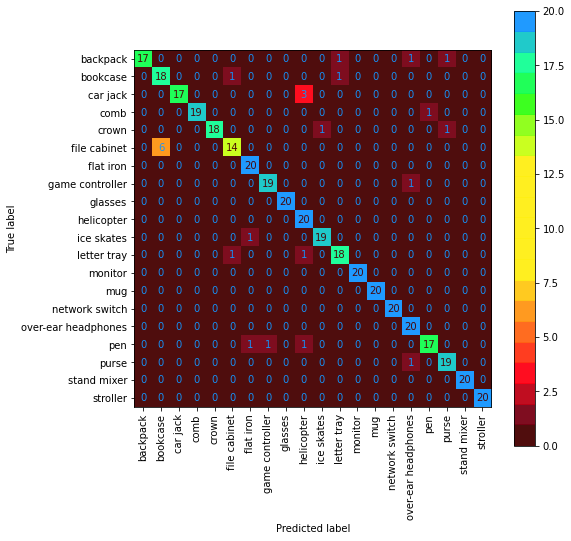

In [ ]:
dsan = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_rw-p.pt')

dsan.to('cuda:0')

loss, acc, outputs, targets = test_DSAN_step(dsan, test_product_loader, get_cost_function())
print(f"Our model accuracy on product domain: {acc}\n")

print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

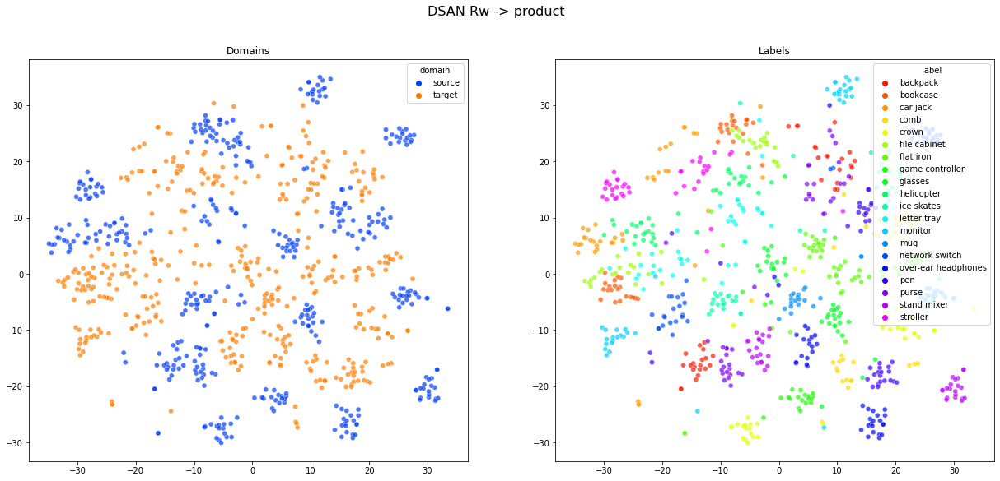

In [ ]:
plot_tsne(dsan, dsan.encoder[8], test_product_loader, test_rworld_loader, "DSAN Rw -> product", dsan=True)

#### DSAN with resnet pretrained for baseline
domain invariant model training for **real world → product** shift

In [ ]:
dsan = train_DSAN(train_rworld_loader_notAug, train_product_loader_notAug, test_product_loader, resnet_size=50, visualization_name='DSAN_resnet_50_pretrained_rw-p', use_new_resnet=False, 
               resnet_path=f'{MODELS_PATH}/baseline_rworld.pt', learning_rate=0.0001, weight_decay=5e-4, epochs=25, use_patience=False, start_patience=3, model_checkpoint_path='dsan_checkpoint_pretrained_rw-p.pt',reset=True, reset_patience=True,use_coral = False)

[*] Local checkpoint folder found
[*] Drive checkpoint folder found
[*] Restoring checkpoints
[*] Checkpoint files not found. Starting from zero


  4%|▍         | 1/25 [01:34<37:47, 94.48s/it]



	 Training loss 3.00152, Training accuracy 9.19
	 Test loss 2.71577, Test accuracy 17.50


  8%|▊         | 2/25 [03:12<37:02, 96.65s/it]



	 Training loss 2.73818, Training accuracy 19.31
	 Test loss 2.37941, Test accuracy 41.25


 12%|█▏        | 3/25 [04:47<35:05, 95.68s/it]



	 Training loss 2.47870, Training accuracy 31.06
	 Test loss 2.08782, Test accuracy 61.00


 16%|█▌        | 4/25 [06:21<33:19, 95.23s/it]



	 Training loss 2.30149, Training accuracy 44.62
	 Test loss 1.89232, Test accuracy 69.50


	 Training loss 2.09178, Training accuracy 57.06
	 Test loss 1.68776, Test accuracy 74.75
[*] Saving checkpoints


 24%|██▍       | 6/25 [09:37<30:33, 96.48s/it]



	 Training loss 1.97946, Training accuracy 65.19
	 Test loss 1.55719, Test accuracy 80.50


 28%|██▊       | 7/25 [11:11<28:44, 95.79s/it]



	 Training loss 1.87223, Training accuracy 72.00
	 Test loss 1.40895, Test accuracy 85.00


 32%|███▏      | 8/25 [12:50<27:22, 96.59s/it]



	 Training loss 1.74110, Training accuracy 78.94
	 Test loss 1.33595, Test accuracy 86.75


 36%|███▌      | 9/25 [14:24<25:36, 96.02s/it]



	 Training loss 1.66575, Training accuracy 83.38
	 Test loss 1.21468, Test accuracy 88.25


	 Training loss 1.57863, Training accuracy 85.75
	 Test loss 1.16076, Test accuracy 87.50
[*] Saving checkpoints


 44%|████▍     | 11/25 [17:40<22:38, 97.07s/it]



	 Training loss 1.51650, Training accuracy 88.44
	 Test loss 1.08560, Test accuracy 89.75


 48%|████▊     | 12/25 [19:15<20:52, 96.31s/it]



	 Training loss 1.45599, Training accuracy 89.94
	 Test loss 1.03193, Test accuracy 90.00


 52%|█████▏    | 13/25 [20:53<19:23, 97.00s/it]



	 Training loss 1.40460, Training accuracy 91.44
	 Test loss 1.01138, Test accuracy 90.75


 56%|█████▌    | 14/25 [22:28<17:39, 96.36s/it]



	 Training loss 1.35463, Training accuracy 92.25
	 Test loss 0.95351, Test accuracy 90.75


	 Training loss 1.33116, Training accuracy 93.62
	 Test loss 0.87656, Test accuracy 91.75
[*] Saving checkpoints


 64%|██████▍   | 16/25 [25:44<14:35, 97.29s/it]



	 Training loss 1.27420, Training accuracy 94.38
	 Test loss 0.87433, Test accuracy 91.50


 68%|██████▊   | 17/25 [27:19<12:52, 96.54s/it]



	 Training loss 1.22418, Training accuracy 96.00
	 Test loss 0.83155, Test accuracy 91.50


 72%|███████▏  | 18/25 [28:54<11:13, 96.19s/it]



	 Training loss 1.21082, Training accuracy 95.38
	 Test loss 0.80421, Test accuracy 91.75


 76%|███████▌  | 19/25 [30:29<09:34, 95.81s/it]



	 Training loss 1.15779, Training accuracy 96.62
	 Test loss 0.79497, Test accuracy 91.50


	 Training loss 1.14837, Training accuracy 96.75
	 Test loss 0.77095, Test accuracy 92.50
[*] Saving checkpoints


 84%|████████▍ | 21/25 [33:45<06:27, 96.75s/it]



	 Training loss 1.10268, Training accuracy 96.94
	 Test loss 0.76596, Test accuracy 93.00


 88%|████████▊ | 22/25 [35:27<04:54, 98.05s/it]



	 Training loss 1.08817, Training accuracy 97.19
	 Test loss 0.73600, Test accuracy 92.50


 92%|█████████▏| 23/25 [37:01<03:14, 97.01s/it]



	 Training loss 1.04992, Training accuracy 97.44
	 Test loss 0.73689, Test accuracy 94.00


 96%|█████████▌| 24/25 [38:39<01:37, 97.38s/it]



	 Training loss 1.04107, Training accuracy 97.94
	 Test loss 0.70627, Test accuracy 94.00


	 Training loss 1.02154, Training accuracy 97.81
	 Test loss 0.70649, Test accuracy 94.25
[*] Saving checkpoints


100%|██████████| 25/25 [40:16<00:00, 96.68s/it]

After training:


	 Training loss 0.45498, Training accuracy 99.12
	 Test loss 0.70649, Test accuracy 94.25
-----------------------------------------------------


In [ ]:
dsan = dsan.to('cpu')
torch.save(dsan, f'{MODELS_PATH}/DSAN_resnet_50_pretrained_rw-p.pt')

In [ ]:
torch.cuda.empty_cache()

Our model accuracy on product domain: 94.25


                     precision    recall  f1-score   support

           backpack       1.00      0.80      0.89        20
           bookcase       0.77      1.00      0.87        20
           car jack       1.00      0.85      0.92        20
               comb       0.95      1.00      0.98        20
              crown       1.00      0.90      0.95        20
       file cabinet       1.00      0.70      0.82        20
          flat iron       1.00      0.95      0.97        20
    game controller       0.95      1.00      0.98        20
            glasses       1.00      0.95      0.97        20
         helicopter       0.83      1.00      0.91        20
         ice skates       1.00      1.00      1.00        20
        letter tray       1.00      0.95      0.97        20
            monitor       1.00      0.90      0.95        20
                mug       0.91      1.00      0.95        20
     network switch       0.95      1.

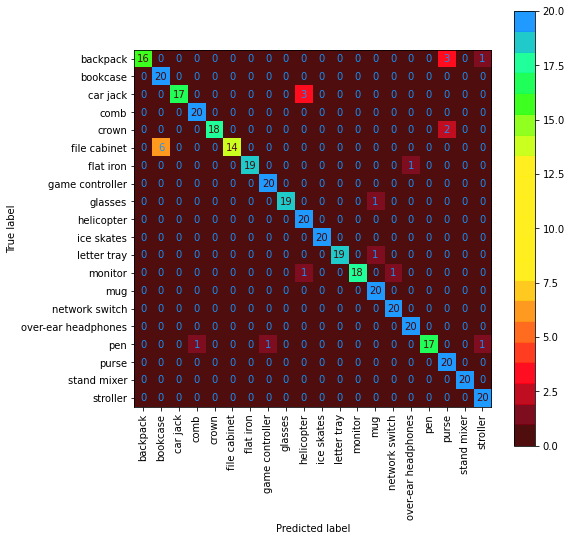

In [ ]:
dsan = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_pretrained_rw-p.pt')

dsan.to('cuda:0')

loss, acc, outputs, targets = test_DSAN_step(dsan, test_product_loader, get_cost_function())
print(f"Our model accuracy on product domain: {acc}\n")

print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

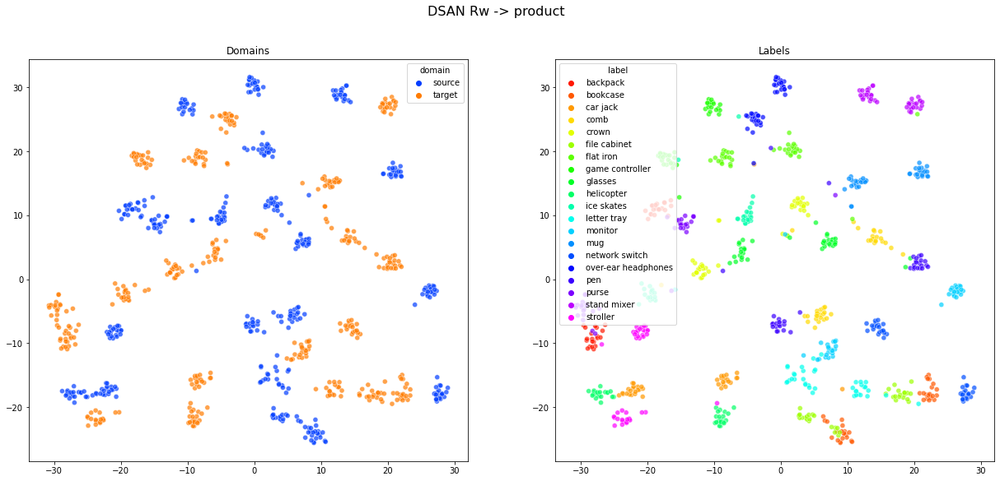

In [ ]:
plot_tsne(dsan, dsan.encoder[8], test_product_loader, test_rworld_loader, "DSAN Rw -> product", dsan=True)

#### DSAN + Coral loss
domain invariant model training for **real world → product** shift

In [ ]:
dsan = train_DSAN(train_rworld_loader_notAug, train_product_loader_notAug, test_product_loader, visualization_name='DSAN_resnet_50_not_pretrained_rw-p_wcoral', use_new_resnet=True, 
               resnet_path=f'{MODELS_PATH}/baseline_rworld.pt', learning_rate=0.0001, weight_decay=5e-4, epochs=50, use_patience=False, start_patience=3, model_checkpoint_path='dsan_checkpoint_rw-p_wcoral.pt',reset=False, reset_patience=True)

[*] Local checkpoint folder found
[*] Drive checkpoint folder found
[*] Restoring checkpoints


0it [00:00, ?it/s]

After training:


	 Training loss 0.17802, Training accuracy 99.56
	 Test loss 0.25394, Test accuracy 95.75
-----------------------------------------------------


In [ ]:
dsan = dsan.to('cpu')
torch.save(dsan, f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_rw-p_wcoral.pt')

Our model accuracy on product domain: 95.75


                     precision    recall  f1-score   support

           backpack       1.00      0.95      0.97        20
           bookcase       0.76      0.95      0.84        20
           car jack       0.95      1.00      0.98        20
               comb       1.00      0.95      0.97        20
              crown       1.00      0.90      0.95        20
       file cabinet       1.00      0.70      0.82        20
          flat iron       0.95      1.00      0.98        20
    game controller       0.95      1.00      0.98        20
            glasses       1.00      1.00      1.00        20
         helicopter       0.95      0.95      0.95        20
         ice skates       1.00      0.95      0.97        20
        letter tray       0.95      1.00      0.98        20
            monitor       1.00      0.95      0.97        20
                mug       1.00      1.00      1.00        20
     network switch       1.00      1.

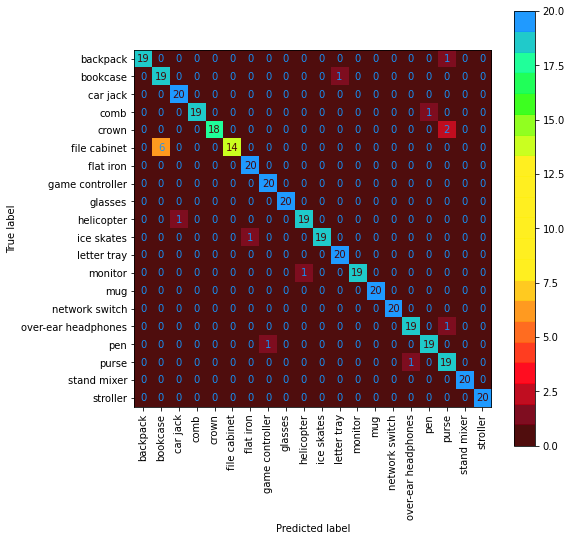

In [ ]:
dsan = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_rw-p_wcoral.pt')

dsan.to('cuda:0')

loss, acc, outputs, targets = test_DSAN_step(dsan, test_product_loader, get_cost_function())
print(f"Our model accuracy on product domain: {acc}\n")

print()
print(classification_report(targets, outputs, labels=[i for i in range(len(classes))], target_names=classes))

fig, ax = plt.subplots(figsize=(8, 8))
ConfusionMatrixDisplay.from_predictions(targets, outputs, ax=ax, display_labels=classes, xticks_rotation='vertical', cmap=CM_CMAP)

plt.show()

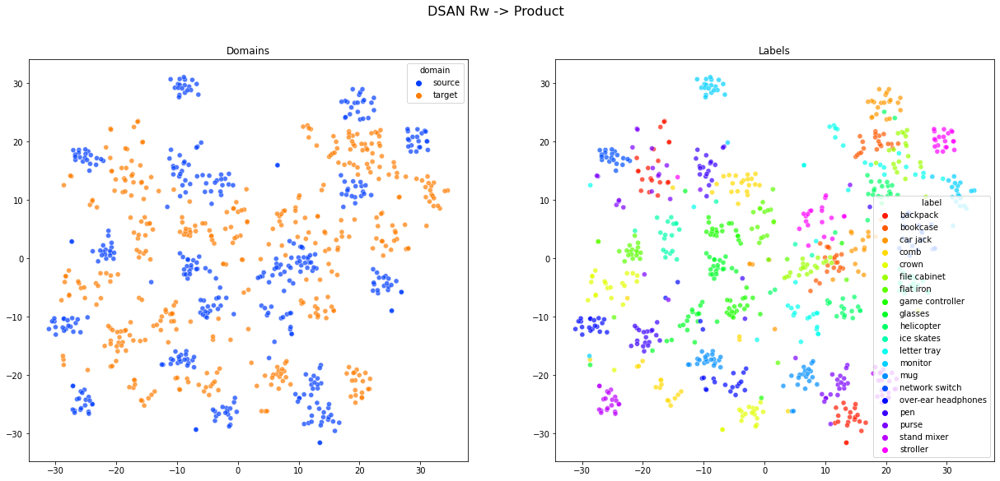

In [ ]:
plot_tsne(dsan, dsan.encoder[8], test_product_loader, test_rworld_loader, "DSAN Rw -> Product", dsan=True)

right image: notice that *file cabinet* and *bookcase* distributions are partially overlapped in both domains for all three models, coherent from what can be seen in the confusion matrices.

In [ ]:
torch.cuda.empty_cache()

## Analysis

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/gdrive/MyDrive/DSAN/Logs/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 114), started 0:29:30 ago. (Use '!kill 114' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# function used to plot distribution of activations
def plot_dist(means_source, means_target, title=''):
    fig, ax = plt.subplots(figsize=(16, 8))
    fig.suptitle(title, fontsize=16, color='#ffffff')

    sns.histplot(means_source.squeeze().cpu(), kde=True, stat="density", color='red', linewidth=0, ax=ax)
    sns.histplot(means_target.squeeze().cpu(), kde=True, stat="density", color='blue', linewidth=0, ax=ax)
    
    ax.tick_params(axis='x', colors='#ffffff')
    ax.tick_params(axis='y', colors='#ffffff')
    ax.xaxis.label.set_color('#ffffff')
    ax.yaxis.label.set_color('#ffffff')
    plt.xlim(-0.25, 1.0)
    plt.legend(labels=['Source', 'Target'], facecolor='#ffffff')
    plt.show()

In [ ]:
# do a forward pass and save activations
def getDistributions(net, layer, inference = None):
    activations_source = {}
    activations_target = {}

    def get_activation(name, activations_dict):
        def hook(model, input, output):
            if name not in activations_dict:
                activations_dict[name] = output.detach()
            else:
                activations_dict[name] = torch.cat((activations_dict[name], output.detach()), 0)
        return hook

    hook = layer.register_forward_hook(get_activation('feature', activations_source))

    # train product loader forward pass
    for batch_idx, (inputs, _) in enumerate(train_product_loader_notAug):
        inputs = inputs.to('cuda:0')
        if inference == None:
            with torch.no_grad():
                net(inputs)
        else:
            inference(inputs)

    hook.remove()

    hook = layer.register_forward_hook(get_activation('feature', activations_target))

    # train rworld loader forward pass
    for batch_idx, (inputs, _) in enumerate(train_rworld_loader_notAug):
        inputs = inputs.to('cuda:0')
        if inference == None:
            with torch.no_grad():
                net(inputs)
        else:
            inference(inputs)

    hook.remove()

    # calculate means and variances
    neurons_means_source = {}
    neurons_variance_source = {}
    for key, item in activations_source.items():
        neurons_means_source[key] = torch.mean(item, dim=0)
        neurons_variance_source[key] = torch.var(item, dim=0)

    neurons_means_target = {}
    neurons_variance_target = {}
    for key, item in activations_target.items():
        neurons_means_target[key] = torch.mean(item, dim=0)
        neurons_variance_target[key] = torch.var(item, dim=0)

    return neurons_means_source, neurons_variance_source, neurons_means_target, neurons_variance_target 

In [ ]:
sns.set(rc={'axes.facecolor':'#383838', 'figure.facecolor':'#383838'})

### Product → real world 

Here we plot the distribution of neuron activations on the last layer of the encoder for source data and target data, in this way we are able to check if the process of domain alignment has been successful.
We expect to see two different gaussian distribution for source and target features in the baseline, which sould be aligned after the DSAN training.

In [ ]:
%%capture

dsan = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_p-rw.pt')
dsan_coral = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_p-rw_wcoral.pt')
baseline = torch.load(f'{MODELS_PATH}/baseline_product.pt')
dsan.to('cuda:0')
dsan_coral.to('cuda:0')
baseline.to('cuda:0')

In [ ]:
means_source_bl, variance_source_bl, means_target_bl, variance_target_bl = getDistributions(baseline, baseline.avgpool)

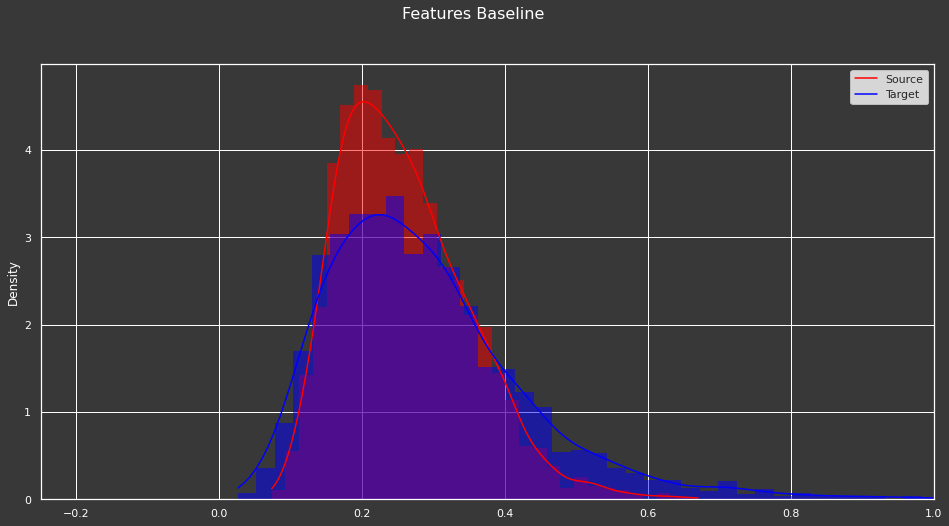

In [ ]:
plot_dist(means_source_bl['feature'], means_target_bl['feature'], title='Features Baseline')

In [ ]:
means_source_d, variance_source_d, means_target_d, variance_target_d = getDistributions(dsan, dsan.encoder[8], inference = dsan.inference)

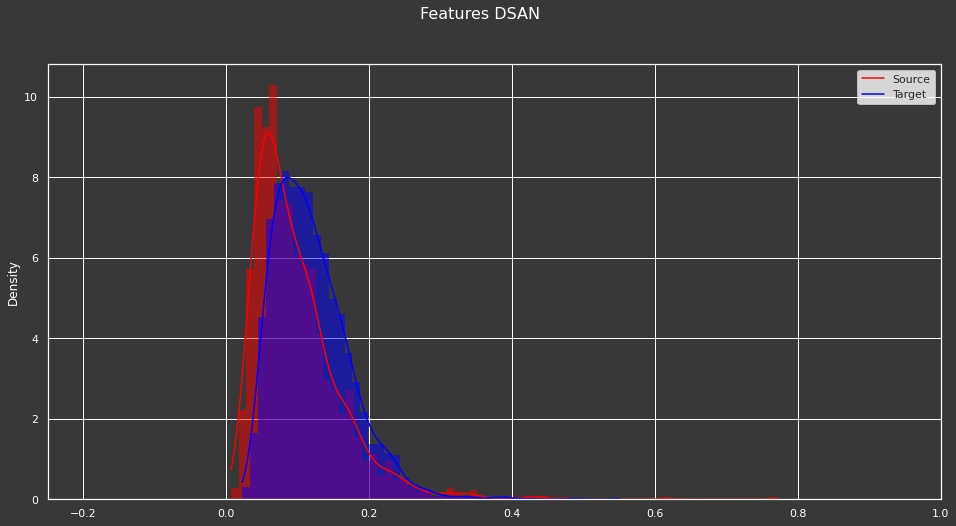

In [ ]:
plot_dist(means_source_d['feature'], means_target_d['feature'], title='Features DSAN')

In [ ]:
means_source_d_coral, variance_source_d_coral, means_target_d_coral, variance_target_d_coral = getDistributions(dsan_coral, dsan_coral.encoder[8], inference = dsan_coral.inference)

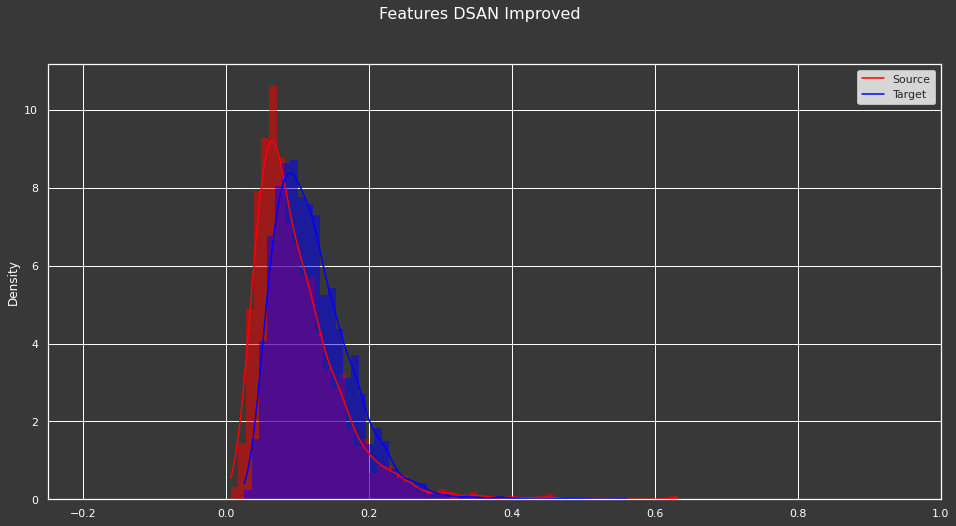

In [ ]:
plot_dist(means_source_d_coral['feature'], means_target_d_coral['feature'], title='Features DSAN Improved')

### Real world → product 

In [ ]:
%%capture

dsan = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_rw-p.pt')
dsan_coral = torch.load(f'{MODELS_PATH}/DSAN_resnet_50_not_pretrained_rw-p_wcoral.pt')
baseline = torch.load(f'{MODELS_PATH}/baseline_rworld.pt')
dsan.to('cuda:0')
dsan_coral.to('cuda:0')
baseline.to('cuda:0')

In [ ]:
means_source_bl, variance_source_bl, means_target_bl, variance_target_bl = getDistributions(baseline, baseline.avgpool)

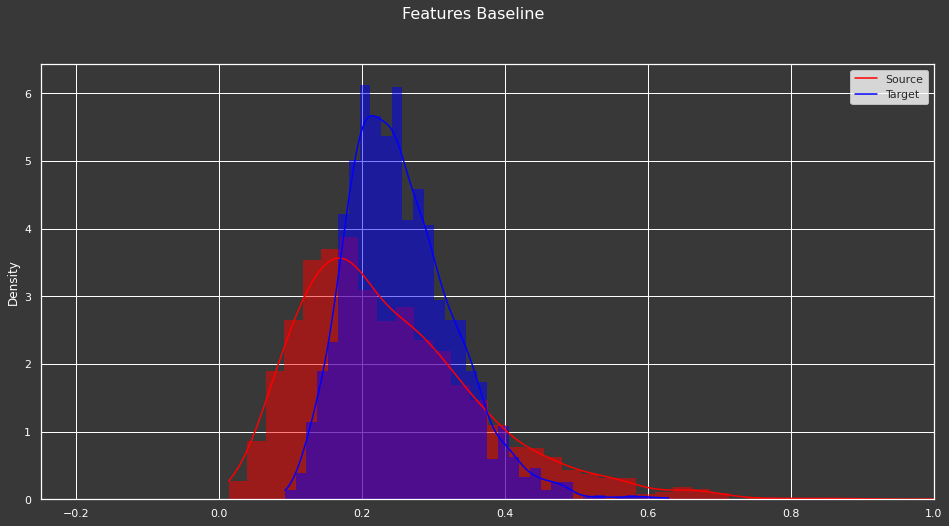

In [ ]:
plot_dist(means_source_bl['feature'], means_target_bl['feature'], title='Features Baseline')

In [ ]:
means_source_d, variance_source_d, means_target_d, variance_target_d = getDistributions(dsan, dsan.encoder[8], inference = dsan.inference)

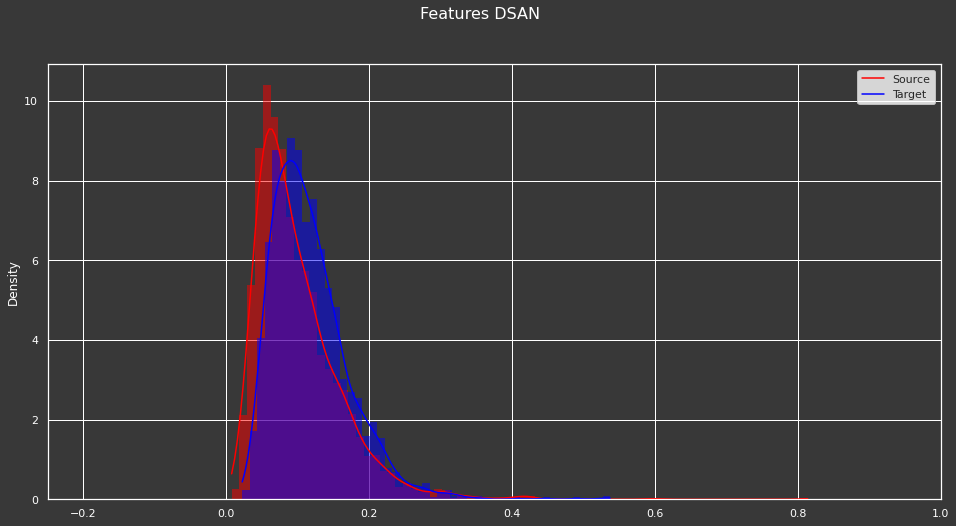

In [ ]:
plot_dist(means_source_d['feature'], means_target_d['feature'], title='Features DSAN')

In [ ]:
means_source_d_coral, variance_source_d_coral, means_target_d_coral, variance_target_d_coral = getDistributions(dsan_coral, dsan_coral.encoder[8], inference = dsan_coral.inference)

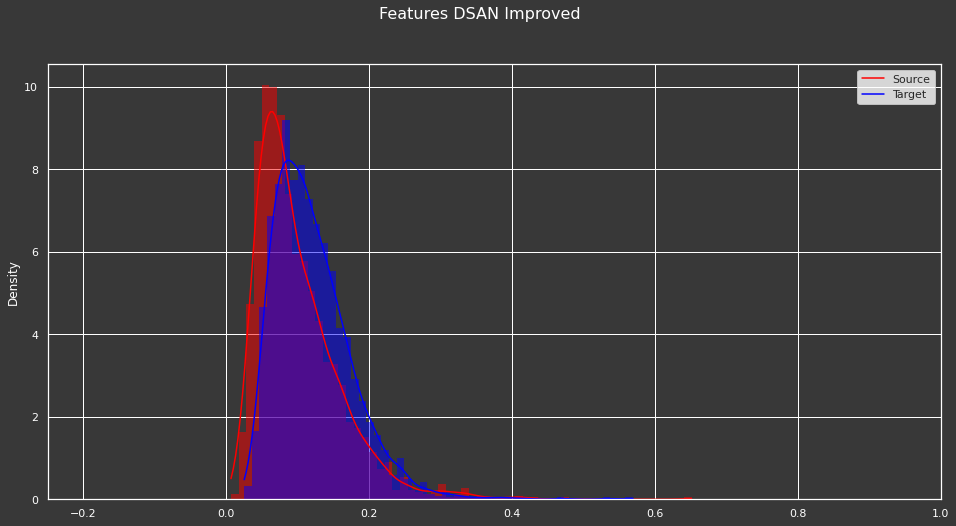

In [ ]:
plot_dist(means_source_d_coral['feature'], means_target_d_coral['feature'], title='Features DSAN Improved')

The results of this plot show us the success of our training, aligning the two distribution, even if not perfectly, so that the network is domain agnostic.

## Summary

<h4>How and why does this work?<h4>
<p>Whether using an adversarial approach or an disalignment loss, the main direction to follow in order to solve a domain adaptation problem is to align the two domain, meaning that the network should percieve the smallest possible difference between images coming from different domains.</p>
<p>With a disalignment loss we can penalize the model for encoding them differently, and in this way draw near the way it interprets the images.</p>
<p>As explained before the DSAN model does something more: it aligns the encoding of images that <i>probably</i> belongs to the same class but different domains.</p>
<hr>

Here are our results:
- Baseline → it represents the performance of the model trained only on one domain and tested on the other, it is our starting point
- Upper bound → it is the same model of the baseline, but it's tested on the same domain used to train it (supervisedly)

- DSAN → our model trained using the DSAN loss, that computes the discrepancy between subdomains
- Pretrained DSAN → same as above, but fine-tuned starting from the encoder already trained for the baseline
- Improved DSAN → our model trained using DSAN loss, CORAL loss (domains discrepancy) and cross-entropy using hard pseudo-labels

The gain is simply computed as the difference between the accuracy on the baseline and the considered model:

$$Gain_{model} = acc_{model}-acc_{baseline}$$


The percentage of gain is computed as the ratio between the gain of the model and the gain of the upper-bound, considered the best score achievable:

$$Gain(\%)_{model} = \frac{Gain_{model}}{Gain_{upper\_bound}}*100$$

<html>
<table>
  <tr>
    <th><h3></h3></th>
    <th><h3>|</h3></th>
    <th colspan=3><h3>P → RW</h3></h3></th>
    <th><h3>|</h3></th>
    <th colspan=3><h3>RW → P</h3></h3></th>
  </tr>
  <tr>
    <th><h3>Models<hr></h3></th>
    <th><h3>|</h3></th>
    <th><h3>Accuracy<hr></h3></th>
    <th><h3>Gain<hr></h3></th>
    <th><h3>Gain (%)<hr></h3></th>
    <th><h3>|</h3></th>
    <th><h3>Accuracy<hr></h3></th>
    <th><h3>Gain<hr></h3></th>
    <th><h3>Gain (%)<hr></h3></th>
  </tr>
  <tr>
    <td><h5>Baseline</h5></td>
    <td><h5>|</h5></td>
    <td><h5>78.25</h5></td>
    <td><h5>-</h5></td>
    <td><h5>-</h5></td>
    <td><h5>|</h5></td>
    <td><h5>92.75</h5></td>
    <td><h5>-</h5></td>
    <td><h5>-</h5></td>
  </tr>
    <tr>
    <td><h5>Upper bound<hr></h5></td>
    <td><h5>|</h5></td>
    <td><h5>93.75<hr></h5></td>
    <td><h5>15.5<hr></h5></td>
    <td><h5>100<hr></h5></td>
    <td><h5>|</h5></td>
    <td><h5>97.25<hr></h5></td>
    <td><h5>4.5<hr></h5></td>
    <td><h5>100<hr></h5></td>
  </tr>
  <tr>
    <td><h5>DSAN</h5></td>
    <td><h5>|</h5></td>
    <td><h5>90</h5></td>
    <td><h5>11.75</h5></td>
    <td><h5>76</h5></td>
    <td><h5>|</h5></td>
    <td><h5>93.75</h5></td>
    <td><h5>1</h5></td>
    <td><h5>22</h5></td>
  </tr>
  <tr>
    <td><h5>Pretrained DSAN</h5></td>
    <td><h5>|</h5></td>
    <td><h5>84.75</h5></td>
    <td><h5>6.5</h5></td>
    <td><h5>42</h5></td>
    <td><h5>|</h5></td>
    <td><h5>94.25</h5></td>
    <td><h5>1.5</h5></td>
    <td><h5>25</h5></td>
  </tr>
    <tr>
    <td><h5><b>Improved DSAN</b></h5></td>
    <td><h5>|</h5></td>
    <td><h5><b>91.75</b></h5></td>
    <td><h5><b>13.5</b></h5></td>
    <td><h5><b>87</b></h5></td>
    <td><h5>|</h5></td>
    <td><h5><b>95.75</b></h5></td>
    <td><h5><b>3</b></h5></td>
    <td><h5><b>67</b></h5></td>
  </tr>
  
</table>
</html>

We expected that the **pretrained DSAN** would perform worse than the standard one in both directions, due to the fact that its starting point is biased toward one of the domain, and it should be more difficult to get domain invariant; but we can see that while it is so in the p → rw direction, in the rw → p direction we have a slight improvement.
We think that the reason for this is that since the features learned from real world domain are already good for classifying in the product domain, the initial bias of the network does not cause any problem, instead it helps the have better performance and its similar to a fine-tuning of the baseline.

From the table we can see that our **improved DSAN** performs better than the standard DSAN and the pretrained DSAN in both directions, with a gain that is more that doubled in some points.
The CORAL loss succesfully helped the DSAN loss in getting the network to be domain insensitive, moreover, the cross-entropy loss obtained from hard pseudo-labels garanteed us that the performance would not decrease consistency during the training and it gave us the possibility to push more the training in order to obtain better results.

As expected looking at the clusters plots we can notice that each class has its own cluster for both domains, resulting in a total of 40 very concentrated clouds instead of 20.
After the DSAN training instead we see that the clusters are much more confused and many subdomains tends to align the two clouds belonging to that specific classes (decreasing in inter-class variance and increasing in intra-class variance).
However the results are not optimal, in fact many other clusters are still far away; for this cases we think the net learns two different encoding for each class, one belonging to a domain and one to the other.
We think that this issue could be partially solved using more samples, meaning that the potential of this approach could be better exploited using the whole dataset consisting in 123 classes.

*NB: the tsne plotting has a stochastic component that cause slightly different results at every run*

The most misclassified classes by the baseline network are *bookcase* with *file cabinet*, *purse* with *backpack* and *network switch* with *monitor*.
From our improved DSAN confusion matrices we can notice that most of this errors are no more presents, except for the *bookcase* - *file cabinet* one in RW → P direction. This could be due to the fact that this is the only case where the context provided by real world domain images does not help to disambiguate between the two cases, so the confusion remains.

It is worth mentioning that even fixing the seed for random generation, we observed a slight oscillation in results in different runs, we didn't perform enough runs to compute a statistic due to lack of time, however the ones we reported seems to us to be the most likely outcomes and not outliers.

## Models and Logs

You can find all the trained models, the checkpoints and the logs in [this folder](https://drive.google.com/drive/folders/1jkQo4eBfY2r23-_kLCP3QRD4V7qH2Cu_?usp=sharing).

# Previous Work Volpi

Before this work, we tried for a couple of months to solve this problem using an adversarial approach based on two GANs.
We gave up when we figured that the reason we were not having any improvement was because there were not the right conditions to use such an approach.
Everything is better explained in the following link:

[Colab notebook](https://colab.research.google.com/drive/1D3fAKqtatqBwU00nyuBpffzSNbUzlY4e?usp=sharing)